# Table of Contents:
- [Utility Functions](#Utility-Functions)
1. [Load All Dataset files]
2. [Merge Data Files]
3. [New Samples Data]
4. [Data Description](#Data-Description)
5. [Import Libraries](#Import-Libraries)
6. [Load & Explore Data](#Load-&-Explore-Data)
7. [Data Cleaning](#Data-Cleaning)
8. [EDA & Business Analysis](#EDA)
9. [Modeling](#Modeling)

# Utility Functions

In [1]:
# Function used to detect Outliers , their counts and percentages
def analyze_IQR_outliers(data, num_columns):
    """
    Analyzes outliers in numerical columns of a DataFrame.

    Args:
        data (pd.DataFrame): The DataFrame containing the data.
        num_columns (list): A list of numerical column names to analyze.

    Returns:
        dict: A dictionary containing outliers, their counts and percentages for each column.
    """

    outlier_data = {}
    for col in num_columns:
        data_column = data[col]
        Q1 = data_column.quantile(0.25)
        Q3 = data_column.quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outliers = data_column[(data_column < lower_bound) | (data_column > upper_bound)]
        outlier_counts = len(outliers)
        outlier_percentages = (outlier_counts / len(data_column)) * 100

        outlier_data[col] = {
            'count': outlier_counts,
            'percentage': outlier_percentages,
            'outliers': outliers.tolist()
        }

        if outlier_counts > 0:
            print(f"No. of IQR outliers in '{col}': {outlier_counts}")
            print(f"Percentage of outliers in '{col}': {outlier_percentages:.2f}%")
            print("-" * 80)
    return outlier_data

In [2]:
# Function to visualize counts, percentages outliers or both
def visualize_outliers(outlier_data, plot_type="counts"):
    """
    Visualizes outliers in numerical columns of a DataFrame using Plotly.

    Args:
        outlier_data (dictionary): The dictionary containing the outliers, their counts, and percentages
                                   for each column.
        plot_type (str, optional): Controls the type of plot to show. Valid options are
                                   "counts", "percentages". Defaults to "counts".

    Returns:
        Plotly visualizations of outliers in numerical columns.
    """

    # Extract the data for plotting
    columns = list(outlier_data.keys())

    # Visualization based on plot_type argument
    if plot_type == "counts":
        counts = [value['count'] for value in outlier_data.values()]
        sorted_columns = [x for _, x in sorted(zip(counts, columns), reverse = True)]
        sorted_count = sorted(counts, reverse = True)

        fig = px.bar(x=sorted_columns, y=sorted_count, color=sorted_columns, text_auto=True)
        fig.update_layout(
            title='Number of Outliers in Each Column',
            xaxis_title='Columns',
            yaxis_title='Count',
            xaxis_tickangle=-90,
            height=800
        )
        fig.show()

    elif plot_type == "percentages":
        percentages = [round(value['percentage'],2) for value in outlier_data.values()]
        sorted_columns = [x for _, x in sorted(zip(percentages, columns), reverse = True)]
        sorted_percentage = sorted(percentages, reverse = True)


        fig = px.bar(x=sorted_columns, y=sorted_percentage, color=sorted_columns, text_auto=True)
        fig.update_layout(
            title='Percentage of Outliers in Each Column',
            xaxis_title='Columns',
            yaxis_title='Percentage',
            xaxis_tickangle=-90,
            height=800
        )
        fig.show()

    else:
        print(f"Invalid plot_type: {plot_type}. Valid options are 'counts', 'percentages', or 'both'.")

In [3]:
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler, StandardScaler, RobustScaler, LabelEncoder

# Regression Models
from sklearn.tree import DecisionTreeRegressor, ExtraTreeRegressor
from xgboost import XGBRegressor, XGBRFRegressor
from sklearn.ensemble import (RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor,
                              VotingRegressor, BaggingRegressor, ExtraTreesRegressor)
from sklearn.linear_model import LinearRegression, SGDRegressor, Lasso, Ridge
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

# Classification Models
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from xgboost import XGBClassifier, XGBRFClassifier
from sklearn.ensemble import (AdaBoostClassifier, RandomForestClassifier, ExtraTreesClassifier,
                              VotingClassifier, GradientBoostingClassifier, BaggingClassifier)
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
import time
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.model_selection import train_test_split


# Metrics
from sklearn.metrics import (mean_squared_error, r2_score, accuracy_score, mean_squared_error,
                             f1_score, precision_score, recall_score, roc_auc_score, mean_absolute_error,
                             roc_curve, auc, average_precision_score, precision_recall_curve, fbeta_score)
from sklearn.metrics import (confusion_matrix, ConfusionMatrixDisplay, classification_report, RocCurveDisplay,
                             PrecisionRecallDisplay)
from mlxtend.plotting import plot_confusion_matrix

In [4]:
def encode_data(X_train, X_test, encoder_type='label', columns=None):
    """
    Encodes the training and testing data using the specified encoder type.

    Parameters:
    X_train (pd.DataFrame): Training data.
    X_test (pd.DataFrame): Testing data.
    encoder_type (str): Type of encoder ('label' or 'onehot'). Default is 'label'.
    columns (list): List of columns to encode. If None, all object type columns are encoded.

    Returns:
    X_train_encoded (pd.DataFrame): Encoded training data.
    X_test_encoded (pd.DataFrame): Encoded testing data.
    """

    if columns is None:
        # Default to all object type columns if no columns are specified
        columns = X_train.select_dtypes(include=['object']).columns.tolist()

    X_train_encoded = X_train.copy()
    X_test_encoded = X_test.copy()

    if encoder_type == 'label':
        for col in columns:
            le = LabelEncoder()
            X_train_encoded[col] = le.fit_transform(X_train[col])
            X_test_encoded[col] = le.transform(X_test[col])

    elif encoder_type == 'onehot':
        for col in columns:
            ohe = OneHotEncoder(handle_unknown='ignore', sparse=False)
            encoded_train = ohe.fit_transform(X_train[[col]])
            encoded_test = ohe.transform(X_test[[col]])

            # Create a DataFrame with the encoded data
            encoded_train_df = pd.DataFrame(encoded_train, columns=ohe.get_feature_names_out([col]))
            encoded_test_df = pd.DataFrame(encoded_test, columns=ohe.get_feature_names_out([col]))

            # Concatenate the new columns to the original dataframes and drop the original columns
            X_train_encoded = pd.concat([X_train_encoded.drop(col, axis=1), encoded_train_df], axis=1)
            X_test_encoded = pd.concat([X_test_encoded.drop(col, axis=1), encoded_test_df], axis=1)

    return X_train_encoded, X_test_encoded

In [5]:
def encode_target(y_train, y_test, encoder_type='label'):
    """
    Encodes the target columns in the training and testing data using the specified encoder type.

    Parameters:
    y_train (pd.Series or pd.DataFrame): Training target data.
    y_test (pd.Series or pd.DataFrame): Testing target data.

    Returns:
    y_train_encoded (pd.Series): Encoded training target data.
    y_test_encoded (pd.Series): Encoded testing target data.
    """

    if encoder_type == 'label':
        encoder = LabelEncoder()
        y_train_encoded = encoder.fit_transform(y_train)
        y_test_encoded = encoder.transform(y_test)
    else:
        raise ValueError("Invalid encoder_type. Currently supported: 'label'.")

    y_train_encoded = pd.Series(y_train_encoded, index=y_train.index)
    y_test_encoded = pd.Series(y_test_encoded, index=y_test.index)

    return y_train_encoded, y_test_encoded

In [6]:
def scale_data(X_train, X_test, scaler_type='standard', columns=None):
    """
    Scales the training and testing data using the specified scaler type.

    Parameters:
    X_train (pd.DataFrame): Training data.
    X_test (pd.DataFrame): Testing data.
    scaler_type (str): Type of scaler ('standard', 'minmax', 'robust'). Default is 'standard'.
    columns (list): List of columns to scale. If None, all numeric columns are scaled.

    Returns:
    X_train_scaled (pd.DataFrame): Scaled training data.
    X_test_scaled (pd.DataFrame): Scaled testing data.
    """

    if columns is None:
        # Default to all numeric columns if no columns are specified
        columns = X_train.select_dtypes(include=['float64', 'int64']).columns.tolist()

    X_train_scaled = X_train.copy()
    X_test_scaled = X_test.copy()

    if scaler_type == 'standard':
        scaler = StandardScaler()
    elif scaler_type == 'minmax':
        scaler = MinMaxScaler()
    elif scaler_type == 'robust':
        scaler = RobustScaler()
    else:
        raise ValueError("Invalid scaler_type. Choose from 'standard', 'minmax', 'robust'.")

    X_train_scaled[columns] = scaler.fit_transform(X_train[columns])
    X_test_scaled[columns] = scaler.transform(X_test[columns])

    return X_train_scaled, X_test_scaled

In [7]:
def evaluate_regression_models(X_train, y_train, X_test, y_test, models):
    """
  Evaluates a list of models, stores results, and returns a DataFrame for comparison and trained models.

  Args:
      X_train (pd.DataFrame): Training features.
      y_train (pd.Series): Training target variable.
      X_test (pd.DataFrame): Testing features.
      y_test (pd.Series): Testing target variable.
      models (list): A list of scikit-learn model objects.

  Returns:
      tuple: A tuple containing two elements:
          - pd.DataFrame: A DataFrame containing model names and evaluation metrics.
          - dict: A dictionary where keys are model names and values are the trained models.
    """

    model_results = []
    trained_models = {}
    for model in models:
        model.fit(X_train, y_train)
        trained_models[model.__class__.__name__] = model  # Save trained model with name
        start_time = time.time()  # Record start time
        prediction = model.predict(X_test)
        inference_time = time.time() - start_time  # Calculate inference time

        print(f"{model} is ready")

        model_results.append({
            "Model-Name": model.__class__.__name__,
            # "MSE": mean_squared_error(y_test, prediction),
            "RMSE": np.sqrt(mean_squared_error(y_test, prediction)),
            "R2_Score": r2_score(y_test, prediction) * 100,
            "MAE": mean_absolute_error(y_test, prediction),
            "Inference Time (ms)": inference_time * 1000,
            "Prediction": prediction,

        })

    models_df = pd.DataFrame(model_results)
    models_df = models_df.set_index('Model-Name')
    return models_df.sort_values("R2_Score", ascending=False), trained_models

In [8]:
# Function used to evaluate a classification model
def evaluate_classification_models(X_train, y_train, X_test, y_test, models):
    """
  Evaluates a list of models, stores results, and returns a DataFrame for comparison and trained models.

  Args:
      X_train (pd.DataFrame): Training features.
      y_train (pd.Series): Training target variable.
      X_test (pd.DataFrame): Testing features.
      y_test (pd.Series): Testing target variable.
      models (list): A list of scikit-learn model objects.

  Returns:
      tuple: A tuple containing two elements:
          - pd.DataFrame: A DataFrame containing model names and evaluation metrics.
          - dict: A dictionary where keys are model names and values are the trained models.
    """

    model_results = []
    trained_models = {}
    for model in models:
        model.fit(X_train, y_train)
        trained_models[model.__class__.__name__] = model  # Save trained model with name
        start_time = time.time()  # Record start time
        prediction = model.predict(X_test)
        prediction_train = model.predict(X_train)
        # y_prob = model.predict_proba(X_test)[:, 1]
        inference_time = time.time() - start_time  # Calculate inference time

        print(f"{model} is ready")

        model_results.append({
            "Model-Name": model.__class__.__name__,
            "Test_Accuracy": accuracy_score(y_test, prediction) * 100,
            "Train_Accuracy": accuracy_score(y_train, prediction_train) * 100,
            "ROC_AUC": roc_auc_score(y_test, prediction),
            "F1_Score": f1_score(y_test, prediction, average="weighted"),
            "Precision": precision_score(y_test, prediction),
            "Recall": recall_score(y_test, prediction),
            "Inference Time (ms)": inference_time * 1000,
            # "F0.5_Score": fbeta_score(y_test, prediction, beta=0.5),
            # "F2_Score": fbeta_score(y_test, prediction, beta=2),
            "Prediction": prediction,
            # "Y_Proba": y_prob,
            # "ROC": roc_curve(y_test, prediction)
        })

    models_df = pd.DataFrame(model_results)
    models_df = models_df.set_index('Model-Name')
    return models_df.sort_values("Test_Accuracy", ascending=False), trained_models

In [9]:
# Function used to plot confusion matrix and classification Report
def evaluate_classification_metrics(y_true, y_pred, target_names=None, display=True):
    """
    Evaluates a classification model by generating a confusion matrix, confusion matrix display (optional), and classification report.

    Args:
        y_true (pd.Series): Ground truth labels.
        y_pred (pd.Series): Predicted labels.
        target_names (list, optional): List of class names for improved readability of the confusion matrix. Defaults to None.
        display (bool, optional): Whether to display the confusion matrix visually using ConfusionMatrixDisplay. Defaults to True.

    Returns:
        dict: A dictionary containing the confusion matrix, classification report, and class names (if provided).
    """

    # Ensure y_true and y_pred are NumPy arrays for compatibility with sklearn metrics
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Generate classification report
    report = classification_report(y_true, y_pred, target_names=target_names)

    # Optionally display confusion matrix visually
    if display:
        ConfusionMatrixDisplay(cm, display_labels=target_names).plot()
        plt.show()  # Display the confusion matrix plot

    cm_normalized = plot_confusion_matrix(conf_mat=cm, class_names=target_names, show_normed=True)

    # Return results in a dictionary for easy access
    evaluation_results = {
        "Confusion Matrix": cm,
        "Confusion Matrix Normalized": cm_normalized,
        "Classification Report": report,
        "Target Names": target_names,  # Include target names if provided
    }
    return evaluation_results


# 1. Data Description

| **Field**      | **Description**     | **Example**                        |
|----------------|-----------------------------------------------------------------------------------------------------|------------------------------------|
| **FlightDate**       | The date of the flight.                                                                                          | 2024-09-09                          |
| **Day_Of_Week**      | The day of the week when the flight occurred.                                                                    | Monday                              |
| **Airline**          | The name or code of the airline operating the flight.                                                            | AA for American Airlines            |
| **Tail_Number**      | The unique identifier (registration number) of the aircraft.                                                     | N123AA                              |
| **Dep_Airport**      | The IATA code of the departure airport.                                                                          | JFK                                 |
| **Dep_CityName**     | The name of the city where the departure airport is located.                                                     | New York                            |
| **DepTime_label**    | The categorized or labeled departure time.                                                                       | Morning                             |
| **Dep_Delay**        | The number of minutes the flight was delayed at departure.                                                       | 15                                  |
| **Dep_Delay_Tag**    | Categorical representation of the departure delay.                                                               | On-time                             |
| **Dep_Delay_Type**   | The type or reason for the departure delay.                                                                      | Operational                         |
| **Arr_Airport**      | The IATA code of the arrival airport.                                                                            | LAX                                 |
| **Arr_CityName**     | The name of the city where the arrival airport is located.                                                       | Los Angeles                         |
| **Arr_Delay**        | The number of minutes the flight was delayed at arrival.                                                         | 10                                  |
| **Arr_Delay_Type**   | The type or reason for the arrival delay.                                                                        | Weather                             |
| **Flight_Duration**  | The duration of the flight.                                                                                      | 300 minutes                         |
| **Distance_type**    | The classification of flight distance.                                                                           | Long-haul                           |
| **Delay_Carrier**    | The number of minutes the delay is attributed to the airline/carrier.                                             | 5                                   |
| **Delay_Weather**    | The number of minutes the delay is attributed to weather conditions.                                              | 10                                  |
| **Delay_NAS**        | The number of minutes the delay is attributed to National Airspace System issues.                                 | 0                                   |
| **Delay_Security**   | The number of minutes the delay is attributed to security-related issues.                                         | 0                                   |
| **Delay_LastAircraft** | The number of minutes the delay is attributed to delays in the aircraft's previous flight.                      | 20                                  |
| **Manufacturer**     | The company that manufactured the aircraft.                                                                      | Boeing                              |
| **Model**            | The model of the aircraft.                                                                                       | Boeing 737                          |
| **Aircraft_age**     | The age of the aircraft in years.                                                                                | 12 years                            |
| **time**             | The specific time or timestamp associated with the flight record.                                                | 12:30 PM                            |
| **tavg**             | The average temperature on the day of the flight.                                                                | 22°C                                |
| **tmin**       | The minimum temperature on the day of the flight.                                                    | 18°C                               |
| **tmax**       | The maximum temperature on the day of the flight.                                                    | 28°C                               |
| **prcp**       | The amount of precipitation on the day of the flight.                                                | 2 mm                               |
| **snow**       | The amount of snowfall on the day of the flight.                                                     | 0 mm                               |
| **wdir**       | The wind direction.                                                                                  | 270°                               |
| **wspd**       | The wind speed.                                                                                      | 15 km/h                            |
| **pres**       | The atmospheric pressure.                                                                            | 1015 hPa                           |
| **airport_id** | A unique identifier for the airport.                                                                 | 12345                              |
| **IATA_CODE**  | The International Air Transport Association code for the airport.                                    | JFK                                |
| **AIRPORT**    | The name of the airport.                                                                             | John F. Kennedy International Airport |
| **CITY**       | The city where the airport is located.                                                               | New York                           |
| **STATE**      | The state or region where the airport is located.                                                    | NY                                 |
| **COUNTRY**    | The country where the airport is located.                                                            | USA                                |
| **LATITUDE**   | The latitude coordinate of the airport.                                                              | 40.6413° N                         |
| **LONGITUDE**  | The longitude coordinate of the airport.                                                             | 73.7781° W                         |

# 2. Import Libraries

In [10]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import seaborn as sns
import datetime
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import StandardScaler, LabelEncoder
from scipy.stats import pointbiserialr, chi2_contingency
from sklearn.feature_selection import mutual_info_classif

In [11]:
pd.set_option("display.max_columns", None)
warnings.filterwarnings("ignore")
sns.set(style="whitegrid")

# 3. Load & Explore Data

In [12]:
flights_df = pd.read_csv("/kaggle/input/2023-us-civil-flights-delay-meteo-and-aircraft/US_flights_2023.csv")
weather_df = pd.read_csv('/kaggle/input/2023-us-civil-flights-delay-meteo-and-aircraft/weather_meteo_by_airport.csv')
location_df = pd.read_csv("/kaggle/input/2023-us-civil-flights-delay-meteo-and-aircraft/airports_geolocation.csv")

In [13]:
print("Columns in flights_df:", flights_df.columns)
print("-"*80)
print("Columns in weather_df:", weather_df.columns)
print("-"*80)
print("Columns in location_df:", location_df.columns)

Columns in flights_df: Index(['FlightDate', 'Day_Of_Week', 'Airline', 'Tail_Number', 'Dep_Airport',
       'Dep_CityName', 'DepTime_label', 'Dep_Delay', 'Dep_Delay_Tag',
       'Dep_Delay_Type', 'Arr_Airport', 'Arr_CityName', 'Arr_Delay',
       'Arr_Delay_Type', 'Flight_Duration', 'Distance_type', 'Delay_Carrier',
       'Delay_Weather', 'Delay_NAS', 'Delay_Security', 'Delay_LastAircraft',
       'Manufacturer', 'Model', 'Aicraft_age'],
      dtype='object')
--------------------------------------------------------------------------------
Columns in weather_df: Index(['time', 'tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'pres',
       'airport_id'],
      dtype='object')
--------------------------------------------------------------------------------
Columns in location_df: Index(['IATA_CODE', 'AIRPORT', 'CITY', 'STATE', 'COUNTRY', 'LATITUDE',
       'LONGITUDE'],
      dtype='object')


In [14]:
merged_df = pd.merge(flights_df, weather_df,
                     how='left',
                     left_on=['Dep_Airport', 'FlightDate'],
                     right_on=['airport_id', 'time'])

final_df = pd.merge(merged_df, location_df,
                    how='left',
                    left_on=['Dep_Airport'],
                    right_on=['IATA_CODE'])

In [15]:
final_df.head()

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Dep_Delay,Dep_Delay_Tag,Dep_Delay_Type,Arr_Airport,Arr_CityName,Arr_Delay,Arr_Delay_Type,Flight_Duration,Distance_type,Delay_Carrier,Delay_Weather,Delay_NAS,Delay_Security,Delay_LastAircraft,Manufacturer,Model,Aicraft_age,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,pres,airport_id,IATA_CODE,AIRPORT,CITY,STATE,COUNTRY,LATITUDE,LONGITUDE
0,2023-01-02,1,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,-3,0,Low <5min,LGA,"New York, NY",-12,Low <5min,56,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,16,2023-01-02,2.9,-2.1,8.3,0.0,0.0,338.0,3.2,1019.1,BDL,BDL,Bradley International Airport,Windsor Locks,CT,USA,41.93887,-72.68323
1,2023-01-03,2,Endeavor Air,N605LR,BDL,"Hartford, CT",Morning,-5,0,Low <5min,LGA,"New York, NY",-8,Low <5min,62,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,16,2023-01-03,1.8,-1.6,4.4,10.7,0.0,3.0,3.6,1015.2,BDL,BDL,Bradley International Airport,Windsor Locks,CT,USA,41.93887,-72.68323
2,2023-01-04,3,Endeavor Air,N331PQ,BDL,"Hartford, CT",Morning,-5,0,Low <5min,LGA,"New York, NY",-21,Low <5min,49,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,10,2023-01-04,5.2,3.9,8.3,6.6,0.0,1.0,7.2,1011.1,BDL,BDL,Bradley International Airport,Windsor Locks,CT,USA,41.93887,-72.68323
3,2023-01-05,4,Endeavor Air,N906XJ,BDL,"Hartford, CT",Morning,-6,0,Low <5min,LGA,"New York, NY",-17,Low <5min,54,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,17,2023-01-05,6.8,3.9,7.8,0.8,0.0,14.0,13.7,1014.8,BDL,BDL,Bradley International Airport,Windsor Locks,CT,USA,41.93887,-72.68323
4,2023-01-06,5,Endeavor Air,N337PQ,BDL,"Hartford, CT",Morning,-1,0,Low <5min,LGA,"New York, NY",-16,Low <5min,50,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,10,2023-01-06,3.3,0.0,3.9,9.7,0.0,0.0,5.8,1016.1,BDL,BDL,Bradley International Airport,Windsor Locks,CT,USA,41.93887,-72.68323


In [16]:
# Separate the data into the two classes (0 and 1)
class_0 = final_df[final_df["Dep_Delay_Tag"] == 0]
class_1 = final_df[final_df['Dep_Delay_Tag'] == 1]

# the minimum count
min_count = 200000

# Randomly sample 'min_count' rows from each class
class_0_sample = class_0.sample(n=min_count, random_state=42)
class_1_sample = class_1.sample(n=min_count, random_state=42)

# Combine the samples into a new balanced dataset
balanced_df = pd.concat([class_0_sample, class_1_sample])

# Shuffle the dataset to mix the rows from both classes
balanced_df = balanced_df.sample(frac=1, random_state=42).reset_index(drop=True)

In [17]:
balanced_df["Dep_Delay_Tag"].value_counts()

Dep_Delay_Tag
0    200000
1    200000
Name: count, dtype: int64

In [18]:
balanced_df.to_csv("dep_delay.csv")

In [19]:
df = pd.read_csv("/kaggle/working/dep_delay.csv")

In [20]:
df.shape

(400000, 42)

In [21]:
df.sample(5)

,Unnamed: 0,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Dep_Delay,Dep_Delay_Tag,Dep_Delay_Type,Arr_Airport,Arr_CityName,Arr_Delay,Arr_Delay_Type,Flight_Duration,Distance_type,Delay_Carrier,Delay_Weather,Delay_NAS,Delay_Security,Delay_LastAircraft,Manufacturer,Model,Aicraft_age,time,tavg,tmin,tmax,prcp,snow,wdir,wspd,pres,airport_id,IATA_CODE,AIRPORT,CITY,STATE,COUNTRY,LATITUDE,LONGITUDE
89516,89516,2023-12-26,2,Skywest Airlines Inc.,N625CA,MSP,"Minneapolis, MN",Afternoon,-3,0,Low <5min,BJI,"Bemidji, MN",-20,Low <5min,61,Short Haul >1500Mi,0,0,0,0,0,CANADAIR REGIONAL JET,CRJ,21,2023-12-26,5.8,1.1,10.0,5.8,0.0,162.0,11.2,1011.7,MSP,MSP,Minneapolis-Saint Paul International Airport,Minneapolis,MN,USA,44.88055,-93.21692
206559,206559,2023-03-12,7,American Airlines Inc.,N652AW,DFW,"Dallas/Fort Worth, TX",Afternoon,13,1,Low <5min,VPS,"Valparaiso, FL",26,Medium >15min,121,Short Haul >1500Mi,13,0,13,0,0,AIRBUS,A320,25,2023-03-12,17.9,10.0,18.9,0.0,0.0,105.5,30.2,1013.7,DFW,DFW,Dallas/Fort Worth International Airport,Dallas-Fort Worth,TX,USA,32.89595,-97.03720
42847,42847,2023-06-14,3,Hawaiian Airlines Inc.,N477HA,LIH,"Lihue, HI",Morning,-7,0,Low <5min,HNL,"Honolulu, HI",-6,Low <5min,36,Short Haul >1500Mi,0,0,0,0,0,BOEING,717,23,2023-06-14,25.0,23.3,27.8,0.3,0.0,63.0,20.2,1018.2,LIH,LIH,Lihue Airport,Lihue,HI,USA,21.97598,-159.33896
255013,255013,2023-03-02,4,Spirit Air Lines,N617NK,MSP,"Minneapolis, MN",Morning,5,1,Low <5min,ATL,"Atlanta, GA",-16,Low <5min,144,Short Haul >1500Mi,0,0,0,0,0,AIRBUS,A320,12,2023-03-02,-4.9,-8.2,-2.1,0.0,180.0,148.0,13.0,1016.4,MSP,MSP,Minneapolis-Saint Paul International Airport,Minneapolis,MN,USA,44.88055,-93.21692
75963,75963,2023-07-14,5,Skywest Airlines Inc.,N120SY,SBA,"Santa Barbara, CA",Morning,-4,0,Low <5min,SFO,"San Francisco, CA",-4,Low <5min,69,Short Haul >1500Mi,0,0,0,0,0,EMBRAER,170/175,10,2023-07-14,18.9,13.3,25.6,0.0,0.0,127.0,7.6,1011.1,SBA,SBA,Santa Barbara Municipal Airport (Santa Barbara...,Santa Barbara,CA,USA,34.42621,-119.84037


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400000 entries, 0 to 399999
Data columns (total 42 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Unnamed: 0          400000 non-null  int64  
 1   FlightDate          400000 non-null  object 
 2   Day_Of_Week         400000 non-null  int64  
 3   Airline             400000 non-null  object 
 4   Tail_Number         400000 non-null  object 
 5   Dep_Airport         400000 non-null  object 
 6   Dep_CityName        400000 non-null  object 
 7   DepTime_label       400000 non-null  object 
 8   Dep_Delay           400000 non-null  int64  
 9   Dep_Delay_Tag       400000 non-null  int64  
 10  Dep_Delay_Type      400000 non-null  object 
 11  Arr_Airport         400000 non-null  object 
 12  Arr_CityName        400000 non-null  object 
 13  Arr_Delay           400000 non-null  int64  
 14  Arr_Delay_Type      400000 non-null  object 
 15  Flight_Duration     400000 non-nul

<div class="alert alert-block alert-info">
    <li> Shape of the data: 400k rows and 42 columns </li>
    <li> 20 categorical columns, 22 numerical columns </li>
    <li> convert `FlightDate` Column to datetime type </li>
</div>

In [23]:
df.describe()

,Unnamed: 0,Day_Of_Week,Dep_Delay,Dep_Delay_Tag,Arr_Delay,Flight_Duration,Delay_Carrier,Delay_Weather,Delay_NAS,Delay_Security,Delay_LastAircraft,Aicraft_age,tavg,tmin,tmax,prcp,snow,wdir,wspd,pres,LATITUDE,LONGITUDE
count,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000,400000.000000
mean,199999.500000,4.003238,17.759160,0.500000,12.275535,141.627200,6.752565,1.014752,3.131887,0.040810,7.535082,13.467037,16.932110,11.962423,22.268509,2.572791,3.268430,188.568459,12.538282,1015.651882,36.519298,-94.996197
std,115470.198175,2.005689,62.176489,0.500001,64.069245,73.482322,41.141515,16.689360,17.320605,1.530797,34.936195,7.907944,9.196426,9.221595,9.791795,8.693244,31.353223,111.057153,5.664548,6.223455,6.009442,18.807012
min,0.000000,1.000000,-46.000000,0.000000,-82.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-36.700000,-76.000000,-33.300000,0.000000,0.000000,0.000000,0.000000,971.700000,-14.278100,-176.646030
25%,99999.750000,2.000000,-5.000000,0.000000,-13.000000,88.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.000000,10.600000,5.600000,15.600000,0.000000,0.000000,83.000000,8.500000,1011.800000,32.895950,-111.977770
50%,199999.500000,4.000000,0.500000,0.500000,-3.000000,125.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.000000,18.100000,12.800000,23.300000,0.000000,0.000000,198.000000,11.700000,1015.300000,36.776190,-87.904460
75%,299999.250000,6.000000,17.000000,1.000000,16.000000,173.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.000000,24.000000,19.400000,29.400000,0.500000,0.000000,289.000000,15.500000,1019.400000,40.692500,-80.943130
max,399999.000000,7.000000,2682.000000,1.000000,2682.000000,722.000000,2682.000000,1439.000000,1651.000000,276.000000,2258.000000,57.000000,42.200000,36.100000,48.300000,571.500000,1780.000000,360.000000,51.100000,1046.900000,71.285450,145.733300


<div class="alert alert-block alert-info">
    <li> Negative values in the `Dep_Delay` column means that the flight <b>departed earlier</b> than the scheduled time. </li>
    <li> Negative values in the `Arr_Delay` column means that the flight <b>arrived earlier</b> than the scheduled time. </li>
</div>

In [24]:
df.describe(include="object")

,FlightDate,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Dep_Delay_Type,Arr_Airport,Arr_CityName,Arr_Delay_Type,Distance_type,Manufacturer,Model,time,airport_id,IATA_CODE,AIRPORT,CITY,STATE,COUNTRY
count,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000,400000
unique,365,15,5914,349,343,4,3,348,342,3,3,5,21,365,349,349,348,334,54,1
top,2023-07-17,Southwest Airlines Co.,N486HA,ATL,"Chicago, IL",Morning,Low <5min,ATL,"Chicago, IL",Low <5min,Short Haul >1500Mi,BOEING,737 NG,2023-07-17,ATL,ATL,Hartsfield-Jackson Atlanta International Airport,Chicago,CA,USA
freq,1301,90810,222,19692,20233,146231,295447,19415,19879,299149,346584,190125,165366,1301,19692,19692,19692,20233,43342,400000


# 4. Data Cleaning

In [25]:
df["FlightDate"] = pd.to_datetime(df["FlightDate"])

In [26]:
df["FlightDate"].head()

0   2023-12-22
1   2023-12-27
2   2023-10-24
3   2023-10-04
4   2023-04-17
Name: FlightDate, dtype: datetime64[ns]

In [27]:
# Extract Month, Day, and Quarter
df['Month'] = df['FlightDate'].dt.month
df['Day'] = df['FlightDate'].dt.day
df['Quarter'] = df['FlightDate'].dt.quarter

<div class="alert alert-block alert-info">
    <li> we can drop `Unnamed: 0` column </li>
    <li> drop `COUNTRY` column as it has one value `USA` as this data of US Airlines </li>
</div>

In [28]:
df = df.drop(columns=["Unnamed: 0", "COUNTRY"])

<div class="alert alert-block alert-info">
    <li> we can drop `airport_id` and `IATA_CODE` as we used them for merging weather and geolocations csv files and they are the same as `Dep_Airport` </li>
    <li> we can drop also `time` as we used it for merging weather data and it is the same as `FlightDate` </li>
</div>

In [29]:
df = df.drop(columns=["airport_id", "IATA_CODE", "time"])

In [30]:
missing = pd.DataFrame(df.isna().sum(), columns=["Null Values"])
missing

,Null Values
FlightDate,0
Day_Of_Week,0
Airline,0
Tail_Number,0
Dep_Airport,0
Dep_CityName,0
DepTime_label,0
Dep_Delay,0
Dep_Delay_Tag,0
Dep_Delay_Type,0


In [31]:
df.duplicated().sum()

0

<div class="alert alert-block alert-info">
    <li> our data is cleaned with no missing values or any duplicates </li>
</div>

In [32]:
num_cols = [col for col in df.columns if df[col].dtype in ["float64", "int64", "int32"]]
cat_cols = [col for col in df.columns if df[col].dtype == "object"]

In [33]:
print(f"Numerical Columns: {num_cols} with count of {len(num_cols)}","\n")
print(f"Categorical Columns: {cat_cols} with count of {len(cat_cols)}")

Numerical Columns: ['Day_Of_Week', 'Dep_Delay', 'Dep_Delay_Tag', 'Arr_Delay', 'Flight_Duration', 'Delay_Carrier', 'Delay_Weather', 'Delay_NAS', 'Delay_Security', 'Delay_LastAircraft', 'Aicraft_age', 'tavg', 'tmin', 'tmax', 'prcp', 'snow', 'wdir', 'wspd', 'pres', 'LATITUDE', 'LONGITUDE', 'Month', 'Day', 'Quarter'] with count of 24 

Categorical Columns: ['Airline', 'Tail_Number', 'Dep_Airport', 'Dep_CityName', 'DepTime_label', 'Dep_Delay_Type', 'Arr_Airport', 'Arr_CityName', 'Arr_Delay_Type', 'Distance_type', 'Manufacturer', 'Model', 'AIRPORT', 'CITY', 'STATE'] with count of 15


In [34]:
df_cleaned = df.copy()

In [35]:
pd.DataFrame(df["Day_Of_Week"].value_counts())

,count
Day_Of_Week,
5,59806
7,59804
4,59653
1,59057
3,55720
2,54238
6,51722


In [36]:
# 1 for Monday and 7 for Sunday
# added 1 to x as it supposed to be from 0 (Monday) to 6 (Sunday)
df_cleaned["Day_Of_Week"] = df_cleaned["Day_Of_Week"].apply(lambda x: datetime.date(2023, 1, x+1).strftime('%A'))

In [37]:
pd.DataFrame(df_cleaned["Day_Of_Week"].value_counts())

,count
Day_Of_Week,
Friday,59806
Sunday,59804
Thursday,59653
Monday,59057
Wednesday,55720
Tuesday,54238
Saturday,51722


In [38]:
pd.DataFrame(df_cleaned["Month"].value_counts())

,count
Month,
7,36200
8,35405
10,34765
6,34417
3,34247
5,33832
4,32891
9,32850
12,32835


In [39]:
# Extract Month names directly
df_cleaned["Month"] = df_cleaned['FlightDate'].dt.strftime('%B')

In [40]:
pd.DataFrame(df_cleaned["Month"].value_counts())

,count
Month,
July,36200
August,35405
October,34765
June,34417
March,34247
May,33832
April,32891
September,32850
December,32835


In [41]:
for col in df_cleaned.columns:
    print(f"{col} : {df_cleaned[col].nunique()}")
    if df_cleaned[col].nunique() < 40:
        print(f"{col} : {df_cleaned[col].unique()}")
        print("-" * 80)

FlightDate : 365
Day_Of_Week : 7
Day_Of_Week : ['Friday' 'Wednesday' 'Tuesday' 'Monday' 'Saturday' 'Sunday' 'Thursday']
--------------------------------------------------------------------------------
Airline : 15
Airline : ['Frontier Airlines Inc.' 'American Airlines Inc.'
 'Southwest Airlines Co.' 'Republic Airways' 'JetBlue Airways'
 'PSA Airlines' 'Delta Air Lines Inc' 'Alaska Airlines Inc.'
 'Spirit Air Lines' 'United Air Lines Inc.' 'Skywest Airlines Inc.'
 'Endeavor Air' 'American Eagle Airlines Inc.' 'Allegiant Air'
 'Hawaiian Airlines Inc.']
--------------------------------------------------------------------------------
Tail_Number : 5914
Dep_Airport : 349
Dep_CityName : 343
DepTime_label : 4
DepTime_label : ['Evening' 'Morning' 'Afternoon' 'Night']
--------------------------------------------------------------------------------
Dep_Delay : 1107
Dep_Delay_Tag : 2
Dep_Delay_Tag : [0 1]
--------------------------------------------------------------------------------
Dep_Delay_T

In [42]:
for col in df_cleaned.columns:
    if df_cleaned[col].nunique() < 40:
        print(pd.DataFrame(df_cleaned[col].value_counts()))
        print("-" * 80)

             count
Day_Of_Week       
Friday       59806
Sunday       59804
Thursday     59653
Monday       59057
Wednesday    55720
Tuesday      54238
Saturday     51722
--------------------------------------------------------------------------------
                              count
Airline                            
Southwest Airlines Co.        90810
Delta Air Lines Inc           56522
American Airlines Inc.        54734
United Air Lines Inc.         42431
Skywest Airlines Inc.         36722
JetBlue Airways               16673
Spirit Air Lines              15918
Republic Airways              15267
Alaska Airlines Inc.          14271
American Eagle Airlines Inc.  12593
Endeavor Air                  10770
Frontier Airlines Inc.        10739
PSA Airlines                  10614
Allegiant Air                  6922
Hawaiian Airlines Inc.         5014
--------------------------------------------------------------------------------
                count
DepTime_label        
Morning    

# 5. Correlation

<Figure size 1500x1500 with 0 Axes>

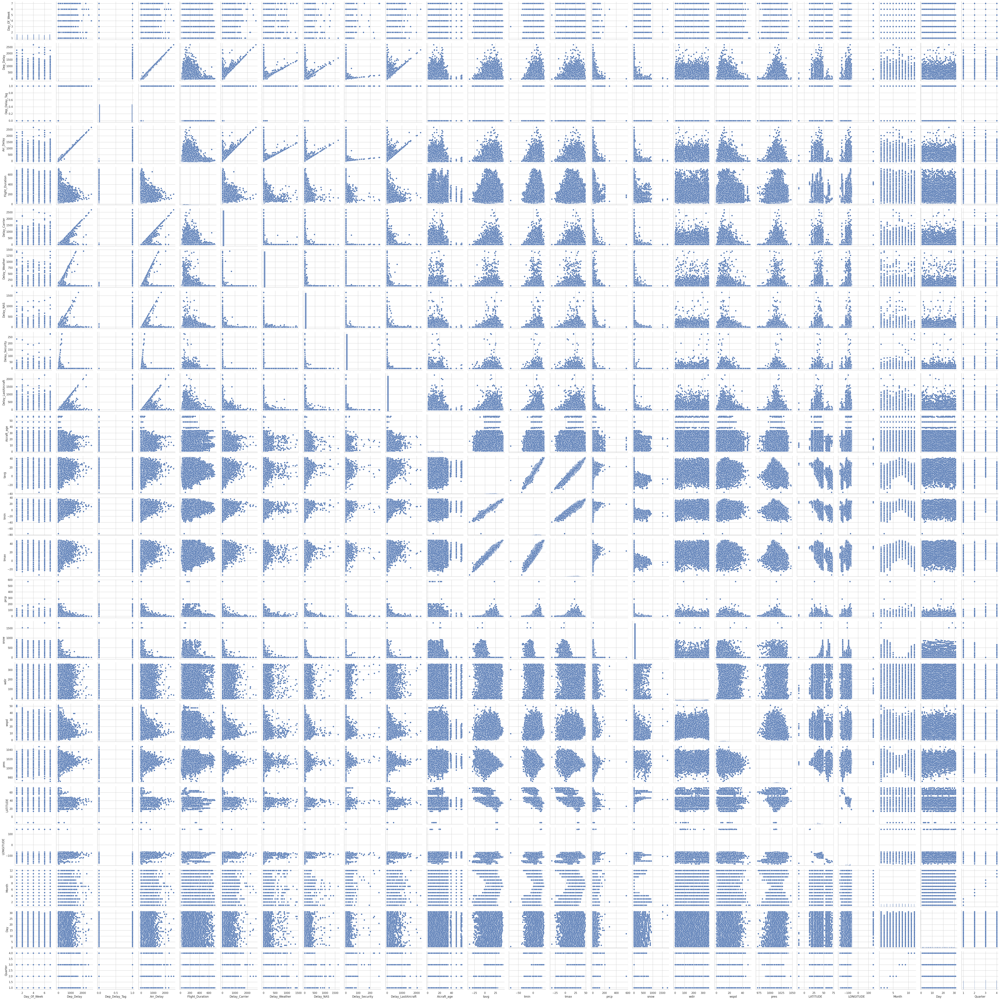

In [43]:
plt.figure(figsize=(15,15));
sns.pairplot(df);
plt.show();

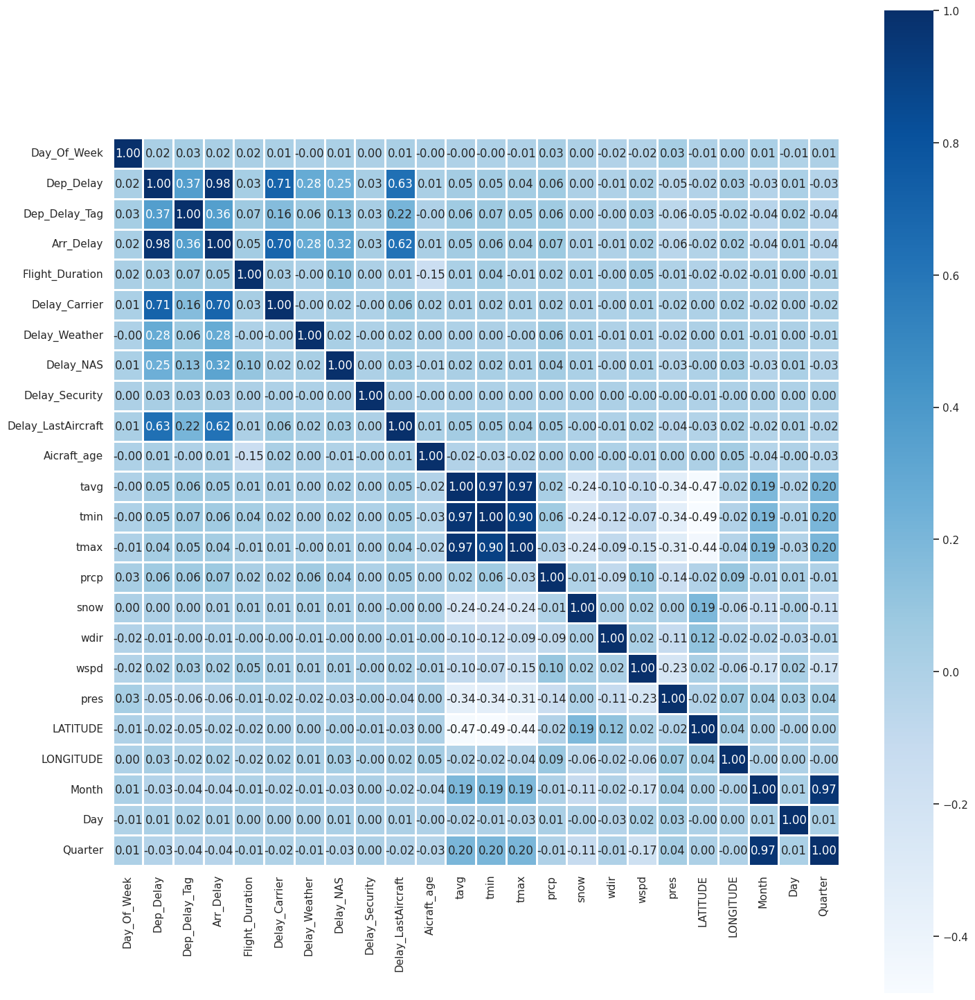

<Figure size 640x480 with 0 Axes>

In [44]:
corr_matrix = df[num_cols].corr()

plt.figure(figsize=(15,15))
sns.heatmap(corr_matrix, annot=True, cmap="Blues", linewidths=1, square=True, fmt=".2f")
plt.tight_layout()
plt.figure();

<div class="alert alert-block alert-warning">
    <li> Features with high correlatoin should one of them droppped</li>
        <ul>
    <li>There is a high correlation between <b>Month</b> and <b>Quarter</b> columns </li>
    <li>There is a high correlation between <b>tmin</b>, <b>tmax</b> and <b>tavg</b> columns </li>
    <li>There is a high correlation between <b>Arr_Delay</b> and <b>Dep_Delay</b> columns </li>
        </ul>
</div>

## Chi-Square & Cramer's V (Chi-Square Normalized)

In [45]:
cat_corr = pd.DataFrame(columns=["Feature","Cramer's V", "Chi-Square", "P-Value"])

# Create a contingency table for a categorical feature and the target column
for col in cat_cols:
    contingency_table = pd.crosstab(df[col], df['Dep_Delay_Tag'])

    # Perform the Chi-Square test
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    # Calculate Cramér’s V
    n = contingency_table.sum().sum()
    cramers_v = np.sqrt(chi2 / (n * (min(contingency_table.shape)-1)))

    # Create a temporary DataFrame for the current feature
    temp_df = pd.DataFrame({
        "Feature": [col],
        "Chi-Square": [chi2],
        "P-Value": [round(p, 6)],
        "Cramer's V": [cramers_v]
    })

    # Use pd.concat() to append the temp_df to cat_corr
    cat_corr = pd.concat([cat_corr, temp_df], ignore_index=True)

In [46]:
cat_corr

,Feature,Cramer's V,Chi-Square,P-Value
0,Airline,0.214923,18476.827469,0.0
1,Tail_Number,0.263738,27823.124640,0.0
2,Dep_Airport,0.161845,10477.498852,0.0
3,Dep_CityName,0.157112,9873.614672,0.0
4,DepTime_label,0.191702,14699.810410,0.0
5,Dep_Delay_Type,0.594879,141552.291951,0.0
6,Arr_Airport,0.131765,6944.831584,0.0
7,Arr_CityName,0.122696,6021.742304,0.0
8,Arr_Delay_Type,0.508429,103400.056637,0.0
9,Distance_type,0.044678,798.460416,0.0


## Mutual Information

In [47]:
df_cpy = df.copy()

In [48]:
for col in cat_cols:
    cat_enc = LabelEncoder()
    df_cpy[col] = cat_enc.fit_transform(df_cpy[col])

In [49]:
MI_data = pd.DataFrame()
MI_data['Feature'] = df_cpy.columns

# Calculate mutual information for each categorical feature with the target
MI_data['Mutual Information'] = [mutual_info_classif(df_cpy[[col]], df_cpy['Dep_Delay_Tag'], random_state= 42) for col in df_cpy.columns]

In [50]:
MI_data = MI_data.sort_values(by= "Mutual Information", ascending= False)
MI_data

,Feature,Mutual Information
8,Dep_Delay_Tag,[0.7427059305615085]
9,Dep_Delay_Type,[0.2596052399972133]
13,Arr_Delay_Type,[0.1856397640582872]
7,Dep_Delay,[0.06464516368173379]
12,Arr_Delay,[0.05778030972899284]
20,Delay_LastAircraft,[0.04666692928535299]
15,Distance_type,[0.04515095807488745]
6,DepTime_label,[0.033759525291390036]
16,Delay_Carrier,[0.026499663767642012]
21,Manufacturer,[0.017140525637022952]


In [51]:
cat_corr["Mutual Information"] = [mutual_info_classif(df_cpy[[col]], df_cpy['Dep_Delay_Tag'], random_state=42) for col in cat_cols]

In [52]:
cat_corr = cat_corr.sort_values(by="Mutual Information", ascending=False)
cat_corr

,Feature,Cramer's V,Chi-Square,P-Value,Mutual Information
5,Dep_Delay_Type,0.594879,141552.291951,0.0,[0.2596052399972133]
8,Arr_Delay_Type,0.508429,103400.056637,0.0,[0.1856397640582872]
9,Distance_type,0.044678,798.460416,0.0,[0.04515095807488745]
4,DepTime_label,0.191702,14699.810410,0.0,[0.033759525291390036]
10,Manufacturer,0.165479,10953.335854,0.0,[0.017140525637022952]
0,Airline,0.214923,18476.827469,0.0,[0.01670168870048272]
1,Tail_Number,0.263738,27823.124640,0.0,[0.014809662543988855]
13,CITY,0.156601,9809.542939,0.0,[0.014294093669263486]
11,Model,0.182787,13364.479956,0.0,[0.014287812602173489]
3,Dep_CityName,0.157112,9873.614672,0.0,[0.014233555444882251]


In [53]:
MI_data[MI_data["Mutual Information"] > 0.1].iloc[1:]

,Feature,Mutual Information
9,Dep_Delay_Type,[0.2596052399972133]
13,Arr_Delay_Type,[0.1856397640582872]


<div class="alert alert-block alert-info">
    This is the most features with mutual information of <b>larger than 10% </b>with target column <b>Dev_Delay_Tag</b>
</div>

# 6. Multi-Colinearity

In [54]:
# Drop target and datetime columns
multico_data = df.drop(["FlightDate", "Dep_Delay_Tag"], axis=1)

In [55]:
# Encoding Categorical features
for col in cat_cols:
    label = LabelEncoder()
    multico_data[col] = label.fit_transform(multico_data[col])

# Standardizing the features
multico_data_scaled = StandardScaler().fit_transform(multico_data)

# Calculating VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = multico_data.columns
vif_data['VIF'] = [variance_inflation_factor(multico_data_scaled, i) for i in range(multico_data_scaled.shape[1])]

In [56]:
vif_data = vif_data.sort_values(by="VIF", ascending=False)
vif_data

,Feature,VIF
22,tavg,91.720565
10,Arr_Delay,45.406681
6,Dep_Delay,34.799503
23,tmin,30.420183
24,tmax,29.810376
14,Delay_Carrier,25.677782
18,Delay_LastAircraft,19.376791
37,Quarter,17.350244
35,Month,17.229678
4,Dep_CityName,6.594965


In [57]:
high_colinearity = vif_data[vif_data["VIF"] > 4.5]
high_colinearity

,Feature,VIF
22,tavg,91.720565
10,Arr_Delay,45.406681
6,Dep_Delay,34.799503
23,tmin,30.420183
24,tmax,29.810376
14,Delay_Carrier,25.677782
18,Delay_LastAircraft,19.376791
37,Quarter,17.350244
35,Month,17.229678
4,Dep_CityName,6.594965


In [58]:
moderate_colinearity = vif_data[(vif_data["VIF"] < 4.5) & (vif_data["VIF"] > 1.41)]
moderate_colinearity

,Feature,VIF
30,AIRPORT,3.227760
3,Dep_Airport,3.074076
12,Flight_Duration,3.067267
13,Distance_type,2.849177
8,Arr_Airport,2.287542
9,Arr_CityName,2.253065
7,Dep_Delay_Type,1.884862
11,Arr_Delay_Type,1.799543
19,Manufacturer,1.731181
33,LATITUDE,1.543236


In [59]:
no_colinearity = vif_data[vif_data["VIF"] < 1.41]
no_colinearity

,Feature,VIF
29,pres,1.408583
34,LONGITUDE,1.307353
32,STATE,1.221344
28,wspd,1.207363
26,snow,1.112031
2,Tail_Number,1.101019
25,prcp,1.098209
1,Airline,1.088053
21,Aicraft_age,1.075430
27,wdir,1.075041


In [60]:
print("Features with HIGH collinearity:", high_colinearity["Feature"].to_list())

Features with HIGH collinearity: ['tavg', 'Arr_Delay', 'Dep_Delay', 'tmin', 'tmax', 'Delay_Carrier', 'Delay_LastAircraft', 'Quarter', 'Month', 'Dep_CityName', 'CITY', 'Delay_Weather', 'Delay_NAS']


<div class="alert alert-block alert-warning">
    <li> Features with High multicollinearity should be droppped or transformed</li>
</div>

In [61]:
print("Features with MODERATE collinearity:", moderate_colinearity["Feature"].to_list())

Features with MODERATE collinearity: ['AIRPORT', 'Dep_Airport', 'Flight_Duration', 'Distance_type', 'Arr_Airport', 'Arr_CityName', 'Dep_Delay_Type', 'Arr_Delay_Type', 'Manufacturer', 'LATITUDE', 'Model']


In [62]:
print("Features with NO collinearity:", no_colinearity["Feature"].to_list())

Features with NO collinearity: ['pres', 'LONGITUDE', 'STATE', 'wspd', 'snow', 'Tail_Number', 'prcp', 'Airline', 'Aicraft_age', 'wdir', 'Delay_Security', 'DepTime_label', 'Day', 'Day_Of_Week']


# 7. Skewness

In [63]:
skew_data = df.drop("FlightDate", axis = 1)

In [64]:
skewness = pd.DataFrame()

skewness["Features"] = df[num_cols].columns
skewness["Skewness"] = [skew_data[col].skew() for col in num_cols]
skewness = skewness.sort_values(by="Skewness", ascending=False)

skewness

,Features,Skewness
8,Delay_Security,84.559004
6,Delay_Weather,38.816517
7,Delay_NAS,21.881111
5,Delay_Carrier,19.159420
15,snow,16.418935
9,Delay_LastAircraft,14.083030
14,prcp,13.493534
1,Dep_Delay,10.388157
3,Arr_Delay,9.617030
4,Flight_Duration,1.364111


In [65]:
# positive skewness (right-skewed)
pos_skew = skewness[skewness["Skewness"] > 0.3]
pos_skew

,Features,Skewness
8,Delay_Security,84.559004
6,Delay_Weather,38.816517
7,Delay_NAS,21.881111
5,Delay_Carrier,19.159420
15,snow,16.418935
9,Delay_LastAircraft,14.083030
14,prcp,13.493534
1,Dep_Delay,10.388157
3,Arr_Delay,9.617030
4,Flight_Duration,1.364111


In [66]:
# negative skewness (left-skewed)
neg_skew = skewness[skewness["Skewness"] < -0.1]
neg_skew

,Features,Skewness
16,wdir,-0.155627
19,LATITUDE,-0.187531
12,tmin,-0.403038
11,tavg,-0.412047
13,tmax,-0.425725
20,LONGITUDE,-0.632974


In [67]:
# no skewness with symmetrical distribution
no_skew = skewness[(skewness["Skewness"] > -0.1) & (skewness["Skewness"] < 0.3)]
no_skew

,Features,Skewness
10,Aicraft_age,0.296397
18,pres,0.127575
2,Dep_Delay_Tag,0.000000
0,Day_Of_Week,-0.003564
22,Day,-0.005158
21,Month,-0.024586
23,Quarter,-0.030540


In [68]:
print("Features with Right Skewness:" ,pos_skew["Features"].to_list())

Features with Right Skewness: ['Delay_Security', 'Delay_Weather', 'Delay_NAS', 'Delay_Carrier', 'snow', 'Delay_LastAircraft', 'prcp', 'Dep_Delay', 'Arr_Delay', 'Flight_Duration', 'wspd']


In [69]:
print("Features with Left Skewness:", neg_skew["Features"].to_list())

Features with Left Skewness: ['wdir', 'LATITUDE', 'tmin', 'tavg', 'tmax', 'LONGITUDE']


<div class="alert alert-block alert-warning">
    <li> Features with RIGHT and LEFT Skewness should be transformed</li>
</div>

In [70]:
print("Features with Symmetrical Distribution:", no_skew["Features"].to_list())

Features with Symmetrical Distribution: ['Aicraft_age', 'pres', 'Dep_Delay_Tag', 'Day_Of_Week', 'Day', 'Month', 'Quarter']


# 8. Outliers

In [71]:
outliers = analyze_IQR_outliers(df, num_cols)

No. of IQR outliers in 'Dep_Delay': 43335
Percentage of outliers in 'Dep_Delay': 10.83%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Arr_Delay': 36180
Percentage of outliers in 'Arr_Delay': 9.04%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Flight_Duration': 20122
Percentage of outliers in 'Flight_Duration': 5.03%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Delay_Carrier': 61272
Percentage of outliers in 'Delay_Carrier': 15.32%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Delay_Weather': 5792
Percentage of outliers in 'Delay_Weather': 1.45%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Delay_NAS': 47689
Percentage of outliers in 'Delay_NAS': 11.92%
-------------------------------------------

In [72]:
visualize_outliers(outliers, plot_type='percentages')

# EDA & Business Analysis

<div class="alert alert-block alert-info">
    <b>Business Questions:</b>
    <ol>
        <li>Time vs. Delays: How do departure and arrival delays vary throughout the day?</li>
        <li>Airline Performance: Which airlines experience the most delays?</li>
        <li>Impact of Weather on Delays: How do weather conditions (temperature, precipitation, wind speed) affect flight delays?</li>
        <li>Day of Week vs. Delays: Which days of the week have the most flight delays?</li>
        <li>Flight Duration and Delays: Is there a relationship between flight duration and the length of delays?</li>
        <li>Geographical Impact: Which airports experience the most delays?</li>
        <li>Aircraft Age and Delays: Do older aircraft have more delays?</li>
        <li>Distance Type vs. Delays: Do long-haul flights experience more delays compared to short-haul flights?</li>
        <li>Precipitation and Delays: How does precipitation affect departure and arrival delays?</li>
        <li>Security-related Delays: How often are delays caused by security-related issues?</li>
    </ol>
        <b>Flight Delay Analysis:</b>
    <ol>
        <li>What is the trend in total flight delays per month across different airports?</li>
        <li>What is the average rate of delays relative to the number of flights per airline?</li>
        <li>How do flight delays and cancellations vary across different age groups of aircraft?</li>
        <li>⁠What are the rates of delays based on the departure city during high and low seasons?</li>
        <li>What is the relationship between flight duration and delay patterns over time?</li>
        <li>What are the top 10 airports with the highest rates of departure delays, and what causes those delays?</li>
    </ol>
    <b>Impact of External Factors on Flight Delays:</b>
    <ol>   
        <li>How does wind speed and direction impact flight delays across different regions?</li>
        <li>How does temperature (min, avg, max) affect flight delays across different times of the day?</li>
        <li>What is the relationship between atmospheric pressure and delays caused by weather-related issues?</li>
    </ol>
    <b>Impact of External Factors on Flight Delays:</b>
        <ol>
        <li>How do flight delays differ between states with varying population densities?</li>
        <li>What is the relationship between flight delays and the distance between departure and arrival cities?</li>
        <li>How do average delays vary based on the airport location's geographical factors (latitude, longitude)?</li>
        <li>What is the correlation between delays and the socio-economic status of the cities served by the airports?</li>
    </ol>

</div>

## Q1

In [73]:
period_order = ["Morning", "Afternoon", "Evening", "Night"]

dep_label = df_cleaned.groupby("DepTime_label")["Dep_Delay"].mean().reset_index()
dep_label = dep_label.sort_values(by="DepTime_label", key=lambda x: x.map({day: i for i, day in enumerate(period_order)}))

arr_label = df_cleaned.groupby("DepTime_label")["Arr_Delay"].mean().reset_index()
arr_label = arr_label.sort_values(by="DepTime_label", key=lambda x: x.map({day: i for i, day in enumerate(period_order)}))

In [74]:
# Line plot for departure and arrival delays vs. DepTime_label

# Create subplots: 1 row, 1 column
fig = make_subplots(rows=1, cols=1)

# Add the Departure Delay line plot
fig.add_trace(
    go.Scatter(x=dep_label["DepTime_label"], y=dep_label["Dep_Delay"],
               mode='lines+markers', name='Departure Delay'))

# Add the Arrival Delay line plot
fig.add_trace(
    go.Scatter(x=arr_label["DepTime_label"], y=arr_label["Arr_Delay"],
               mode='lines+markers', name='Arrival Delay'))

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Departure and Arrival Delays throughout the Day",
    xaxis_title="Time of Day",
    yaxis_title="Delay (min)",
    legend_title="Delay Type"
)

fig.show()

- Delays are at its atmost at the Evening and Afternoon periods and are its lowest

In [75]:
# Line plot for departure and arrival delays vs. DepTime_label
dep_delay_avg_quarter = df_cleaned.groupby("Quarter")["Dep_Delay"].mean().reset_index()
arr_delay_avg_quarter = df_cleaned.groupby("Quarter")["Arr_Delay"].mean().reset_index()

# Create subplots: 1 row, 1 column
fig = make_subplots(rows=1, cols=1)

# Add the Departure Delay line plot
fig.add_trace(
    go.Scatter(x=dep_delay_avg_quarter["Quarter"], y=dep_delay_avg_quarter["Dep_Delay"],
               mode='lines+markers', name='Departure Delay'))

# Add the Arrival Delay line plot
fig.add_trace(
    go.Scatter(x=arr_delay_avg_quarter["Quarter"], y=arr_delay_avg_quarter["Arr_Delay"],
               mode='lines+markers', name='Arrival Delay'))

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Departure and Arrival Delays throughout the Quarter",
    xaxis_title="Quarters of Year",
    yaxis_title="Delay (min)",
    legend_title="Delay Type"
)

fig.show()

- Delays in the third quarter of the year are the most which is in July, August, September

In [76]:
month_order = ["January", "February", "March", "April", "May", "June",
               "July", "August", "September", "October", "November", "December"]

dep_month = df_cleaned.groupby("Month")["Dep_Delay"].mean().reset_index()
dep_month = dep_month.sort_values(by="Month", key=lambda x: x.map({month: i for i, month in enumerate(month_order)}))

arr_month = df_cleaned.groupby("Month")["Arr_Delay"].mean().reset_index()
arr_month = arr_month.sort_values(by="Month", key=lambda x: x.map({month: i for i, month in enumerate(month_order)}))

In [77]:
# Line plot for departure and arrival delays vs. DepTime_label

# Create subplots: 1 row, 1 column
fig = make_subplots(rows=1, cols=1)

# Add the Departure Delay line plot
fig.add_trace(
    go.Scatter(x=dep_month["Month"], y=dep_month["Dep_Delay"],
               mode='lines+markers', name='Departure Delay'))

# Add the Arrival Delay line plot
fig.add_trace(
    go.Scatter(x=arr_month["Month"], y=arr_month["Arr_Delay"],
               mode='lines+markers', name='Arrival Delay'))

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Departure and Arrival Delays throughout the Months",
    xaxis_title="Month",
    yaxis_title="Delay (min)",
    legend_title="Delay Type"
)

fig.show()

- Delays are the most in July and June Months

## Q2
##### Same as Flight Delay Analysis Q2 What is the average rate of delays relative to the number of flights per airline?

In [78]:
# Average delays per airline
avg_dep_delay_airline = df_cleaned.groupby("Airline")["Dep_Delay"].sum().reset_index()
avg_arr_delay_airline = df_cleaned.groupby("Airline")["Arr_Delay"].sum().reset_index()

# Create a figure with subplots
fig = go.Figure()

# Add bars for Departure Delays
fig.add_trace(
    go.Bar(x=avg_dep_delay_airline["Airline"], y=avg_dep_delay_airline["Dep_Delay"], name='Average Departure Delay',
           marker_color='blue')
)

# Add bars for Arrival Delays
fig.add_trace(
    go.Bar(x=avg_dep_delay_airline["Airline"], y=avg_arr_delay_airline["Arr_Delay"], name='Average Arrival Delay',
           marker_color='red')
)

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Average Departure and Arrival Delays by Airline",
    xaxis_title="Airline",
    yaxis_title="Delay (min)",
    barmode='group',  # Group bars together
    legend_title="Delay Type"
)

fig.show()

In [79]:
# Average delays per airline
avg_dep_delay_airline = df_cleaned.groupby("Airline")["Dep_Delay"].mean().reset_index()
avg_arr_delay_airline = df_cleaned.groupby("Airline")["Arr_Delay"].mean().reset_index()

# Create a figure with subplots
fig = go.Figure()

# Add bars for Departure Delays
fig.add_trace(
    go.Bar(x=avg_dep_delay_airline["Airline"], y=avg_dep_delay_airline["Dep_Delay"], name='Average Departure Delay',
           marker_color='blue')
)

# Add bars for Arrival Delays
fig.add_trace(
    go.Bar(x=avg_dep_delay_airline["Airline"], y=avg_arr_delay_airline["Arr_Delay"], name='Average Arrival Delay',
           marker_color='red')
)

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Average Departure and Arrival Delays by Airline",
    xaxis_title="Airline",
    yaxis_title="Delay (min)",
    barmode='group',  # Group bars together
    legend_title="Delay Type"
)

fig.show()

In [80]:
df_cleaned.groupby(["Manufacturer", "Model"])["Dep_Delay"].mean().reset_index()

,Manufacturer,Model,Dep_Delay
0,AIRBUS,A220,21.885223
1,AIRBUS,A300,17.335484
2,AIRBUS,A319,24.056457
3,AIRBUS,A320,25.679438
4,AIRBUS,A320,67.500000
5,AIRBUS,A321,24.179834
6,AIRBUS,A330,33.020854
7,AIRBUS,A350,38.283186
8,BOEING,717,10.332344
9,BOEING,737,14.895735


In [81]:
# Average delays per airline
avg_dep_delay_manufac = df_cleaned.groupby("Manufacturer")["Dep_Delay"].mean().reset_index()
avg_arr_delay_manufac = df_cleaned.groupby("Manufacturer")["Arr_Delay"].mean().reset_index()

# Create a figure with subplots
fig = go.Figure()

# Add bars for Departure Delays
fig.add_trace(
    go.Bar(x=avg_dep_delay_manufac["Manufacturer"], y=avg_dep_delay_manufac["Dep_Delay"], name='Average Departure Delay',
           marker_color='blue')
)

# Add bars for Arrival Delays
fig.add_trace(
    go.Bar(x=avg_dep_delay_manufac["Manufacturer"], y=avg_arr_delay_manufac["Arr_Delay"], name='Average Arrival Delay',
           marker_color='red')
)

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Average Departure and Arrival Delays by Manufacturer",
    xaxis_title="Manufacturer",
    yaxis_title="Delay (min)",
    barmode='group',  # Group bars together
    legend_title="Delay Type"
)

fig.show()

In [82]:
# Average delays per airline
avg_dep_delay_model = df_cleaned.groupby("Model")["Dep_Delay"].mean().reset_index()
avg_arr_delay_model = df_cleaned.groupby("Model")["Arr_Delay"].mean().reset_index()

# Create a figure with subplots
fig = go.Figure()

# Add bars for Departure Delays
fig.add_trace(
    go.Bar(x=avg_dep_delay_model["Model"], y=avg_dep_delay_model["Dep_Delay"], name='Average Departure Delay',
           marker_color='blue')
)

# Add bars for Arrival Delays
fig.add_trace(
    go.Bar(x=avg_arr_delay_model["Model"], y=avg_arr_delay_model["Arr_Delay"], name='Average Arrival Delay',
           marker_color='red')
)

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Average Departure and Arrival Delays by Model",
    xaxis_title="Model",
    yaxis_title="Delay (min)",
    barmode='group',  # Group bars together
    legend_title="Delay Type"
)

fig.show()

## Q3

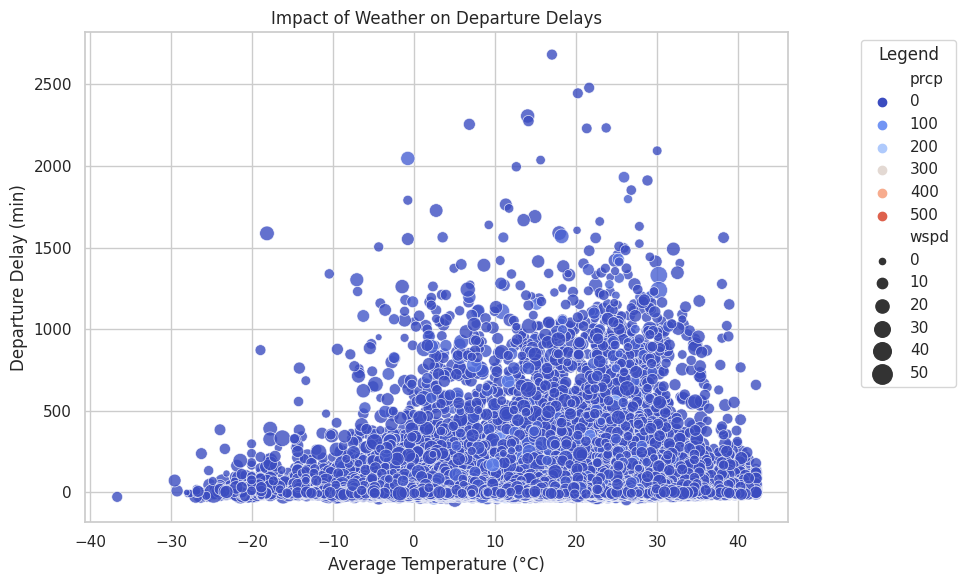

In [83]:
# Create the scatter plot using Seaborn
plt.figure(figsize=(10, 6))

scatter = sns.scatterplot(data=df_cleaned, x="tavg", y="Dep_Delay", hue="prcp", size="wspd", alpha=0.8,
                          sizes=(20, 200), palette="coolwarm", legend="auto")

# Set plot title and axis labels
scatter.set_title("Impact of Weather on Departure Delays")
scatter.set_xlabel("Average Temperature (°C)")
scatter.set_ylabel("Departure Delay (min)")

# Adjust the legend to show size (wind speed) and color (precipitation)
plt.legend(title="Legend", loc="upper right", bbox_to_anchor=(1.25, 1))

# Show the plot
plt.tight_layout()
plt.show()

## Q4

In [84]:
days_order = ["Monday", "Tuesday", "Wednesday", "Thursday","Friday","Saturday", "Sunday"]

dep_day = df_cleaned.groupby("Day_Of_Week")["Dep_Delay"].mean().reset_index()
dep_day = dep_day.sort_values(by="Day_Of_Week", key=lambda x: x.map({day: i for i, day in enumerate(days_order)}))

arr_day = df_cleaned.groupby("Day_Of_Week")["Arr_Delay"].mean().reset_index()
arr_day = arr_day.sort_values(by="Day_Of_Week", key=lambda x: x.map({day: i for i, day in enumerate(days_order)}))

In [85]:
# Line plot for departure and arrival delays vs. DepTime_label

# Create subplots: 1 row, 1 column
fig = make_subplots(rows=1, cols=1)

# Add the Departure Delay line plot
fig.add_trace(
    go.Scatter(x=dep_day["Day_Of_Week"], y=dep_day["Dep_Delay"],
               mode='lines+markers', name='Departure Delay'))

# Add the Arrival Delay line plot
fig.add_trace(
    go.Scatter(x=arr_day["Day_Of_Week"], y=arr_day["Arr_Delay"],
               mode='lines+markers', name='Arrival Delay'))

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Departure and Arrival Delays throughout the Week Days",
    xaxis_title="Day of the Week",
    yaxis_title="Delay (min)",
    legend_title="Delay Type"
)

fig.show()

- Delay is at its atmost level on Sunday (holidays) while its lower level on Tuesday

In [86]:
# Create a figure with subplots
fig = go.Figure()

# Add bars for Departure Delays
fig.add_trace(
    go.Bar(x=dep_day["Day_Of_Week"], y=dep_day["Dep_Delay"], name='Average Departure Delay',
           marker_color='blue')
)

# Add bars for Arrival Delays
fig.add_trace(
    go.Bar(x=arr_day["Day_Of_Week"], y=arr_day["Arr_Delay"], name='Average Arrival Delay',
           marker_color='red')
)

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Average Departure and Arrival Delays by Day of Week",
    xaxis_title="Day of Week",
    yaxis_title="Delay (min)",
    barmode='group',  # Group bars together
    legend_title="Delay Type"
)

fig.show()

## Q5

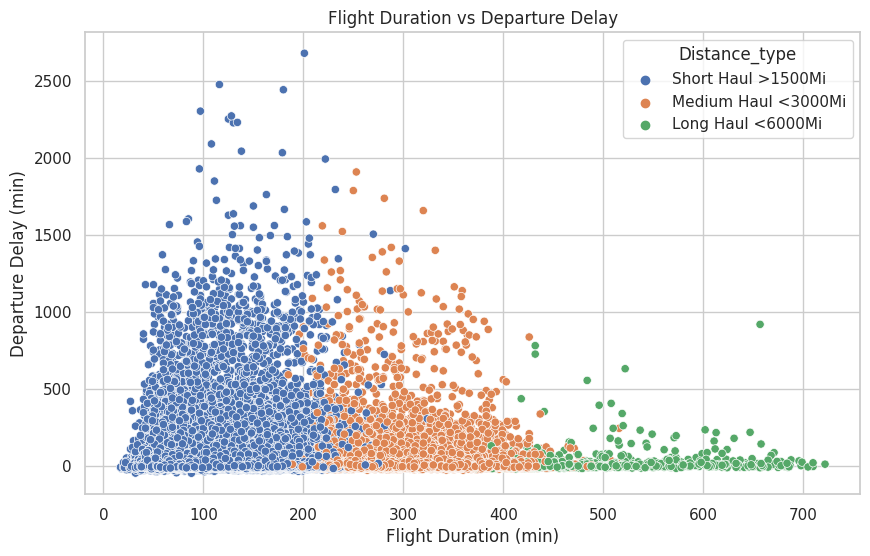

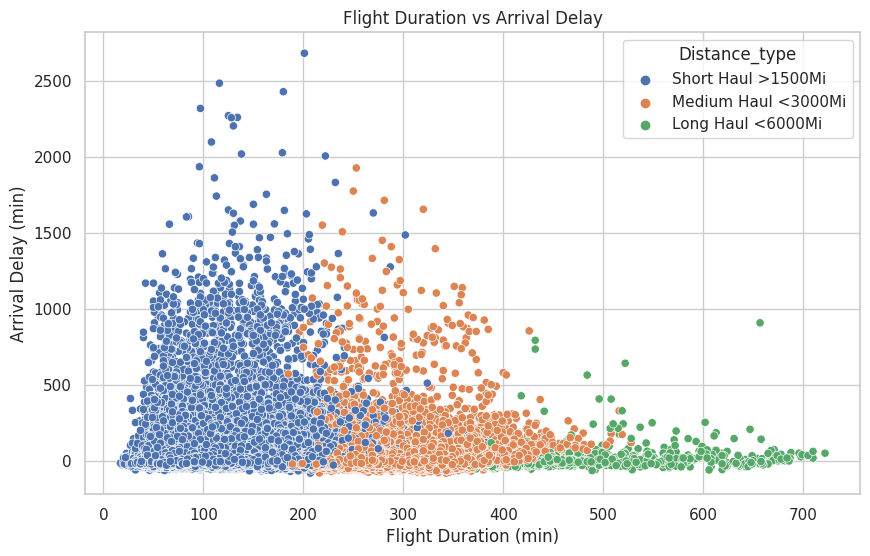

In [87]:
# Create the first scatter plot for Flight Duration vs Departure Delay
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_cleaned, x="Flight_Duration", y="Dep_Delay", hue='Distance_type')
plt.title("Flight Duration vs Departure Delay")
plt.xlabel("Flight Duration (min)")
plt.ylabel("Departure Delay (min)")
plt.show()

# Create the second scatter plot for Flight Duration vs Arrival Delay
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_cleaned, x="Flight_Duration", y="Arr_Delay", hue="Distance_type")
plt.title("Flight Duration vs Arrival Delay")
plt.xlabel("Flight Duration (min)")
plt.ylabel("Arrival Delay (min)")
plt.show()

## Q6
##### Same as Flight Delay Analysis Q6 What are the top 10 airports with the highest rates of departure delays, and what causes those delays?

In [88]:
dep_city = df_cleaned.groupby(["Dep_CityName", "Delay_Carrier"])["Dep_Delay"].mean().reset_index()
arr_city = df_cleaned.groupby(["Arr_CityName", "Delay_Weather"])["Arr_Delay"].mean().reset_index()

top_dep_cities = dep_city.nlargest(10, 'Dep_Delay')
top_arr_cities = arr_city.nlargest(10, 'Arr_Delay')

In [89]:
# Bar plot
fig = px.bar(top_dep_cities, x='Dep_CityName', y='Dep_Delay', color='Delay_Carrier',
              title="Top 10 Cities with Highest Rates of Departure Delays")
fig.show()

# Bar plot
fig = px.bar(top_arr_cities, x='Arr_CityName', y=abs(top_arr_cities['Arr_Delay']),color='Delay_Weather',
              title="Top 10 Cities with Highest Rates of Arrival Delays")
fig.show()

In [90]:
# Grouping by airport and reason for delay, and selecting the top 10 airports
airport_delay = df_cleaned.groupby(['Dep_Airport', 'Delay_Carrier'])['Dep_Delay'].mean().reset_index()
airport_weather = df_cleaned.groupby(['Dep_Airport', 'Delay_Weather'])['Dep_Delay'].mean().reset_index()

top_airports = airport_delay.nsmallest(10, 'Dep_Delay')
top_weather = airport_weather.nsmallest(10, 'Dep_Delay')

# Bar plot
fig6 = px.bar(top_airports, x='Dep_Airport', y='Dep_Delay', color='Delay_Carrier',
              title="Top 10 Airports with Lowest Rates of Departure Delays")
fig6.show()

# Bar plot
fig6 = px.bar(top_weather, x='Dep_Airport', y='Dep_Delay', color='Delay_Weather',
              title="Top 10 Airports with Lowest Rates of Departure Delays")
fig6.show()

## Q8

In [91]:
# Box plot for distance type vs. delays
# Average delays per airport
avg_dep_delay_distance = df_cleaned.groupby("Distance_type")["Dep_Delay"].mean().reset_index()
avg_arr_delay_distance = df_cleaned.groupby("Distance_type")["Arr_Delay"].mean().reset_index()

# Create a figure with subplots
fig = go.Figure()

# Add bars for Departure Delays
fig.add_trace(
    go.Bar(x=avg_dep_delay_distance["Distance_type"], y=avg_dep_delay_distance["Dep_Delay"], name='Average Departure Delay',
           marker_color='blue')
)

# Add bars for Arrival Delays
fig.add_trace(
    go.Bar(x=avg_arr_delay_distance["Distance_type"], y=avg_arr_delay_distance["Arr_Delay"], name='Average Arrival Delay',
           marker_color='red')
)

# Update layout for axis titles and legends
fig.update_layout(
    title_text="Average Departure and Arrival Delays by Dep. and Arr. Airport",
    xaxis_title="Airport",
    yaxis_title="Delay (min)",
    barmode='group',  # Group bars together
    legend_title="Delay Type"
)

fig.show()

## Q10

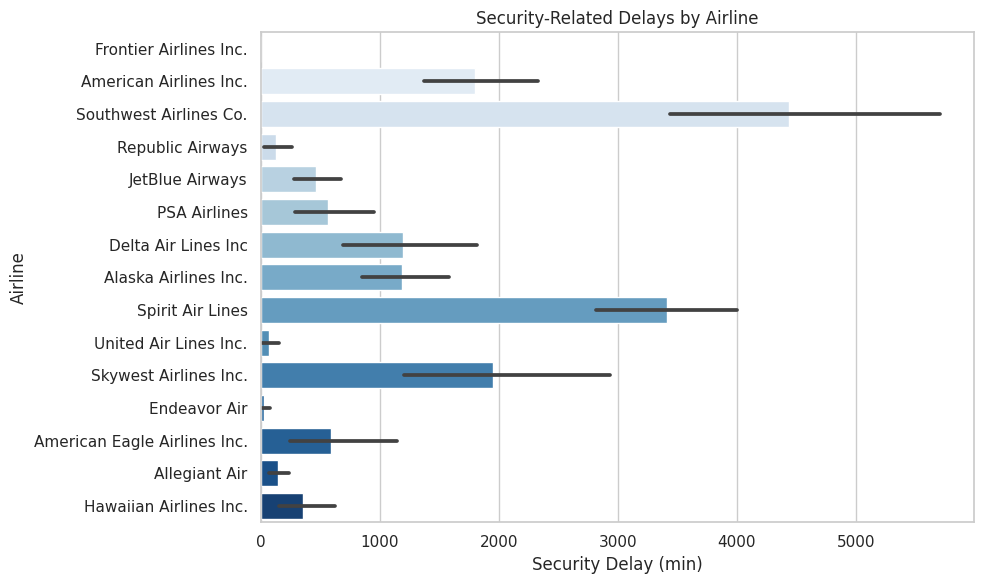

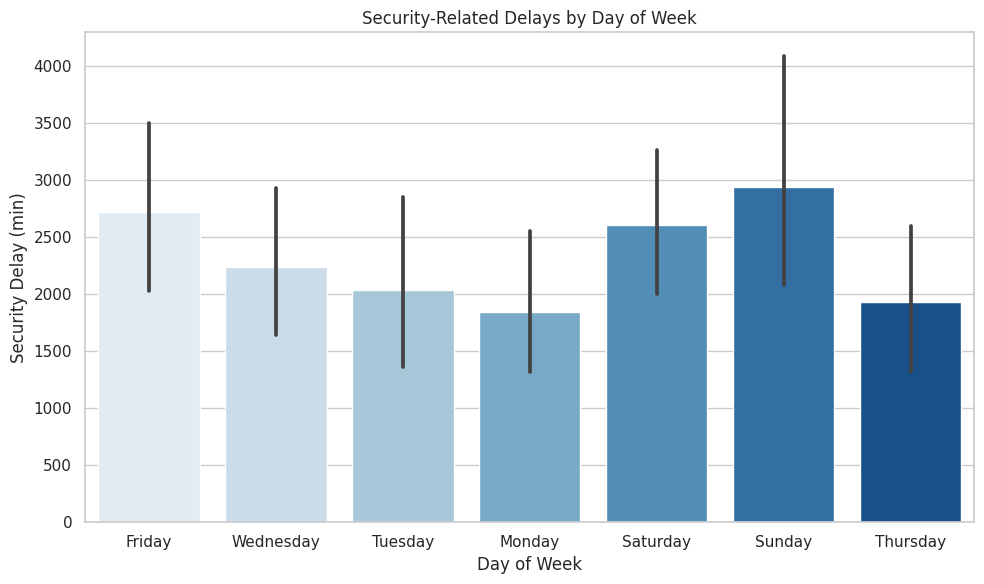

In [92]:
# Bar plot for Security-Related Delays by Airline
plt.figure(figsize=(10, 6))
sns.barplot(data=df_cleaned, y="Airline", x="Delay_Security", estimator="sum", palette="Blues")  # Can also use mean, sum, etc.
plt.title("Security-Related Delays by Airline")
plt.xlabel("Security Delay (min)")
plt.ylabel("Airline")
plt.tight_layout()
plt.show()

# Bar plot for Security-Related Delays by Day of Week
plt.figure(figsize=(10, 6))
sns.barplot(data=df_cleaned, x="Day_Of_Week", y="Delay_Security", palette="Blues", estimator=sum)  # Can also use mean, sum, etc.
plt.title("Security-Related Delays by Day of Week")
plt.xlabel("Day of Week")
plt.ylabel("Security Delay (min)")
plt.tight_layout()
plt.show()

### Q5

In [93]:
# make them as bins of Flight Duration each hour or 1.5 hour then bar plot better
# Bin the Flight_Duration column
# bins = [0, 60, 120, 180, 240, 300, 360, 800]
bins = [0, 90, 180, 270, 360, 800]

# labels = ['1 hour', '2 hours', '3 hours', '4 hours', '5 hours', '6 hours', "> 6 hours"]
labels = ['1.5 hour', '3 hours', '4.5 hours', '6 hours', "> 6 hours"]  # Bin labels

df_cleaned['Flight_Duration_Binned'] = pd.cut(df_cleaned['Flight_Duration'], bins=bins, labels=labels, right=False)

# Aggregate Dep_Delay by Flight_Duration_Binned
agg_df = df_cleaned.groupby('Flight_Duration_Binned')['Dep_Delay'].mean().reset_index()

# Create the bar plot
fig = px.bar(agg_df, x='Flight_Duration_Binned', y='Dep_Delay',
             title='Average Departure Delay by Flight Duration',
             labels={'Flight_Duration_Binned': 'Flight Duration', 'Dep_Delay': 'Average Departure Delay'})
fig.show()


### Q1

In [94]:
# Bin the wspd column
bins = [0, 5, 10, 15, 20, 25, 30]  # Define your bin edges
labels = ['0-5', '5-10', '10-15', '15-20', '20-25', '25-30']  # Bin labels
df_cleaned['wspd_Binned'] = pd.cut(df_cleaned['wspd'], bins=bins, labels=labels, right=False)

# Aggregate Dep_Delay by wspd_Binned
agg_df = df_cleaned.groupby('wspd_Binned')['Dep_Delay'].mean().reset_index()

# Create the bar plot
fig = px.bar(agg_df, x='wspd_Binned', y='Dep_Delay',
             title='Average Departure Delay by Wind Speed Binned',
             labels={'wspd_Binned': 'Wind Speed Bin', 'Dep_Delay': 'Average Departure Delay'})
fig.show()


### Q2

In [95]:
# Bin the tavg column
bins = [-30, -20, -10, 0, 10, 20, 30, 40, 50]  # Define your bin edges
labels = ['-30 - -20', '-20 - -10', '-10 - 0', '0-10', '10-20', '20-30', '30-40', '40-50']  # Bin labels
df_cleaned['tavg_Binned'] = pd.cut(df_cleaned['tavg'], bins=bins, labels=labels, right=False)

# Aggregate Dep_Delay by tavg_Binned and DepTime_label
agg_df = df_cleaned.groupby(['tavg_Binned', 'DepTime_label'])['Dep_Delay'].mean().reset_index()

# Round the average Dep_Delay to two decimal points
agg_df['Dep_Delay'] = agg_df['Dep_Delay'].round(2)

# Create the bar plot
fig = px.bar(agg_df, x='tavg_Binned', y='Dep_Delay', color='DepTime_label', text_auto=True,
             title='Average Departure Delay by Temperature and Time of Day',
             labels={'tavg_Binned': 'Temperature', 'Dep_Delay': 'Average Departure Delay'})
fig.show()

### Q3

<div class="alert alert-block alert-info">
<b>Note:</b> Normal Atmospheric Pressure is about 1013.25 hPa (millibars) </div>

In [96]:
# Line plot of pressure vs weather-related delays
pres_weather = df_cleaned.groupby("pres")["Delay_Weather"].mean().reset_index()
fig9 = px.line(pres_weather, x='pres', y='Delay_Weather', title="Atmospheric Pressure vs Weather-Related Delays")
fig9.show()

pres_weather = df_cleaned[df_cleaned["Dep_Delay"]<100].groupby("wspd")["Dep_Delay"].mean().reset_index()
fig9 = px.line(pres_weather, x='wspd', y='Dep_Delay', title="Atmospheric Pressure vs Average Departure Delays")
fig9.show()

### Q1

In [97]:
# Assuming you have STATE and population data
state_delay = df_cleaned.groupby('STATE')['Dep_Delay'].mean().reset_index()

# Choropleth map showing delay across states
fig10 = px.choropleth(state_delay, locations='STATE', locationmode='USA-states', color='Dep_Delay',
                      title="Flight Delays by State")
fig10.show()

## Q2

In [98]:
# Sum the delay columns
delay_columns = ['Delay_Carrier', 'Delay_Weather', 'Delay_NAS', 'Delay_Security', 'Delay_LastAircraft']
delay_sums = df[delay_columns].sum()

# Create a pie chart with Plotly
fig = px.pie(
    values=delay_sums,
    names=delay_columns,
    title='Distribution of Delay Types',
)

# Customize the chart appearance
fig.update_traces(
    textinfo='percent+label',
    rotation=120  # Start angle for wedges
)

# Show the plot
fig.show()

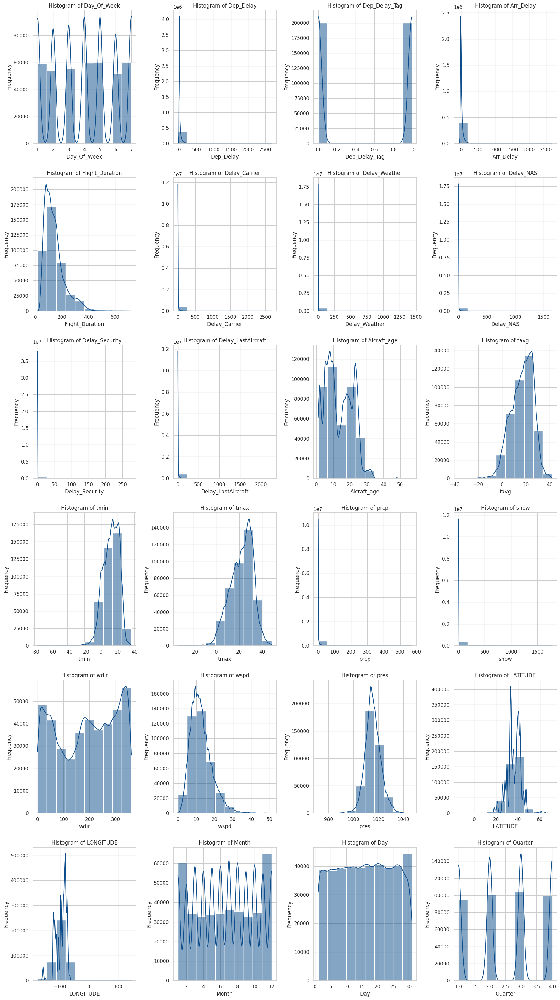

In [99]:
# Histogram For Columns
fig, axes = plt.subplots(6, 4, figsize=(18, 32))

axes = axes.flatten()

for i, col in enumerate(num_cols):
    sns.histplot(df[col], color="#0c4c8a",bins=10, kde=True, ax=axes[i])
    axes[i].set_title(f'Histogram of {col}')
    axes[i].set_xlabel(col)
    axes[i].set_ylabel('Frequency')

# Remove any empty subplots
for i in range(len(num_cols), len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()

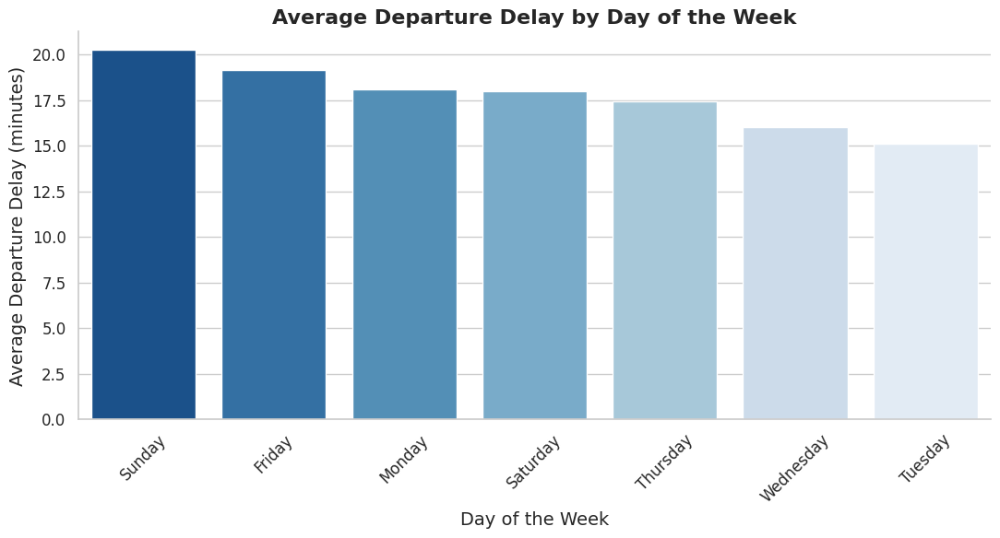

In [100]:
# Bar Plot Delay in  week days 
# Group by day of the week and calculate the mean departure delay
mean_dep_delay_by_day = df_cleaned.groupby('Day_Of_Week')['Dep_Delay'].mean().sort_values(ascending=False)

# Generate color palette
palette = sns.color_palette("Blues_r", len(mean_dep_delay_by_day))

# Plot the data
plt.figure(figsize=(11, 6))
sns.barplot(x=mean_dep_delay_by_day.index, y=mean_dep_delay_by_day.values, palette=palette)

# Adding labels and title
plt.title('Average Departure Delay by Day of the Week', fontsize=16, fontweight='bold')
plt.xlabel('Day of the Week', fontsize=14)
plt.ylabel('Average Departure Delay (minutes)', fontsize=14)

# Rotate x-axis labels
plt.xticks(rotation=45, fontsize=12)
plt.yticks(fontsize=12)

# Remove extra borders
sns.despine()

# Display the plot
plt.tight_layout()
plt.show()

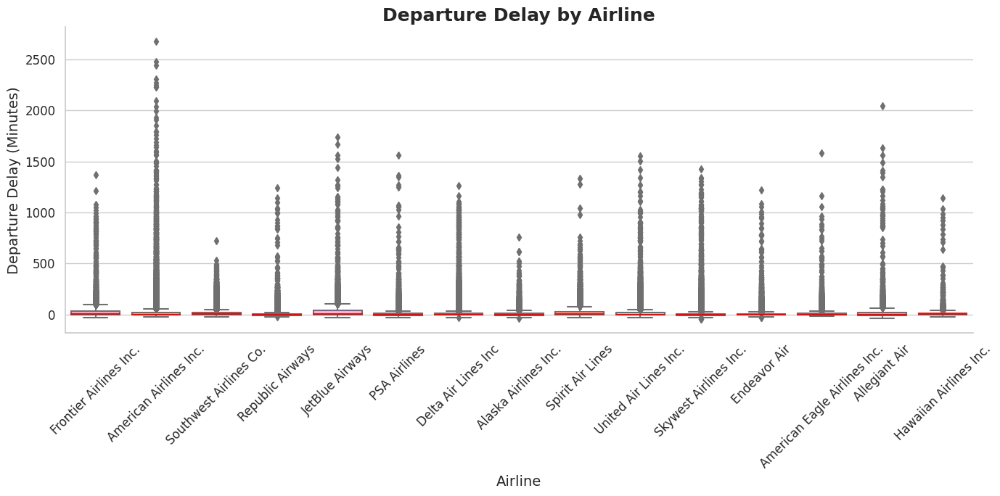

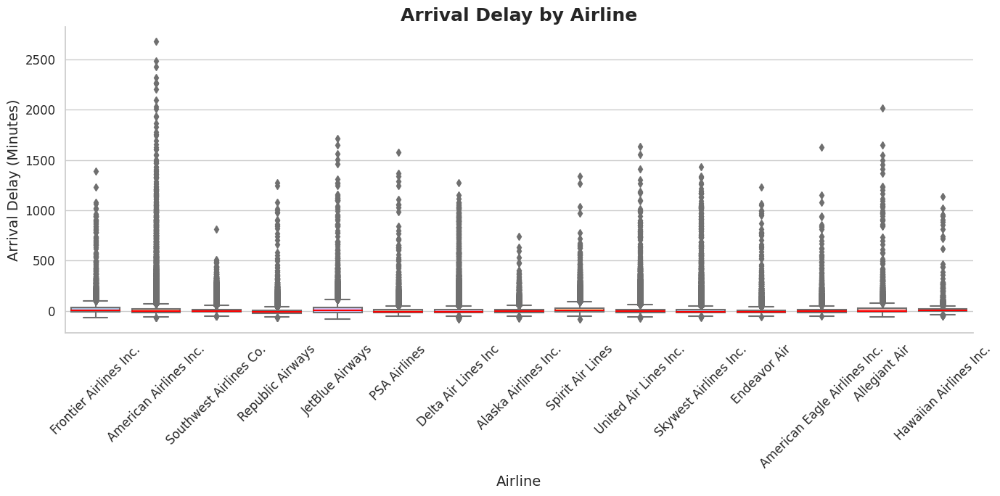

In [101]:
# Box Plot for Dep,Arr Delays
plt.figure(figsize=(14, 7))  
sns.boxplot(
    x='Airline',
    y='Dep_Delay',
    data=df,
    palette='pastel',   
    linewidth=1.5, 
    fliersize=5,  
    medianprops=dict(color='red')  
)
plt.title('Departure Delay by Airline', fontsize=18, fontweight='bold')
plt.xlabel('Airline', fontsize=14)
plt.ylabel('Departure Delay (Minutes)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)  
plt.yticks(fontsize=12)
sns.despine()  
plt.tight_layout() 
plt.show()

plt.figure(figsize=(14, 7))  
sns.boxplot(
    x='Airline',
    y='Arr_Delay',
    data=df,
    palette='pastel',
    linewidth=1.5,  
    fliersize=5,  
    medianprops=dict(color='red')  
)
plt.title('Arrival Delay by Airline', fontsize=18, fontweight='bold')
plt.xlabel('Airline', fontsize=14)
plt.ylabel('Arrival Delay (Minutes)', fontsize=14)
plt.xticks(rotation=45, fontsize=12)  
plt.yticks(fontsize=12)
sns.despine() 
plt.tight_layout()  
plt.show()

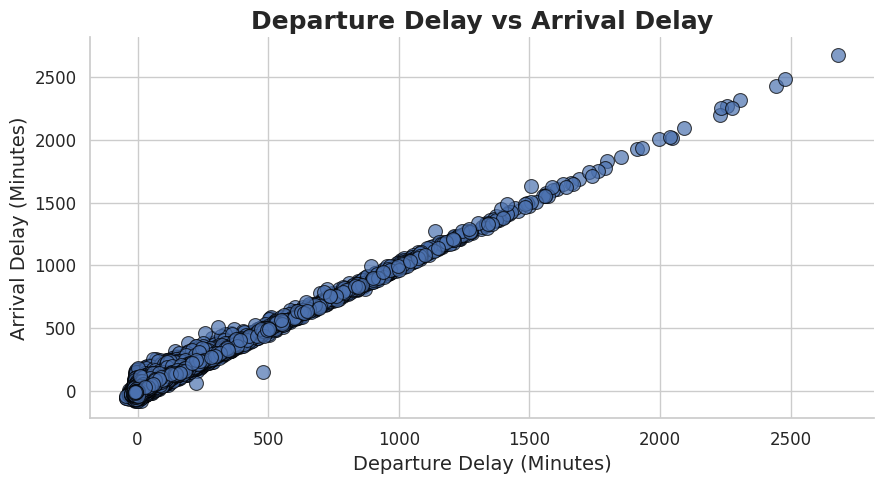

In [102]:
# Correlation Between Dep,Arr Delays 
plt.figure(figsize=(9, 5))

sns.scatterplot(
    x='Dep_Delay', 
    y='Arr_Delay', 
    data=df, 
 #   hue='Airline',  # rical variable
    palette='coolwarm',
    s=100,  
    alpha=0.7,
    edgecolor='black'  
)

plt.title('Departure Delay vs Arrival Delay', fontsize=18, fontweight='bold')
plt.xlabel('Departure Delay (Minutes)', fontsize=14)
plt.ylabel('Arrival Delay (Minutes)', fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

sns.despine()

plt.tight_layout()

plt.show()

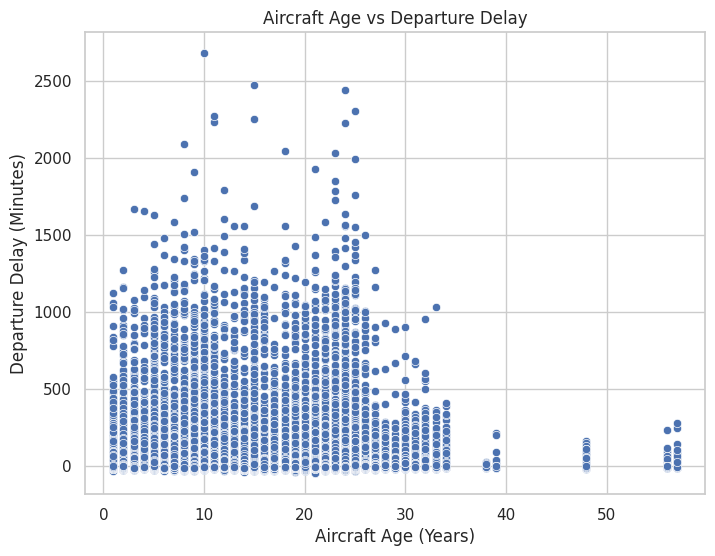

In [103]:
# Relation Between Aircraft Age VS Departure Delay 
plt.figure(figsize=(8,6))
sns.scatterplot(x='Aicraft_age', y='Dep_Delay', data=df)
plt.title('Aircraft Age vs Departure Delay')
plt.xlabel('Aircraft Age (Years)')
plt.ylabel('Departure Delay (Minutes)')
plt.show()

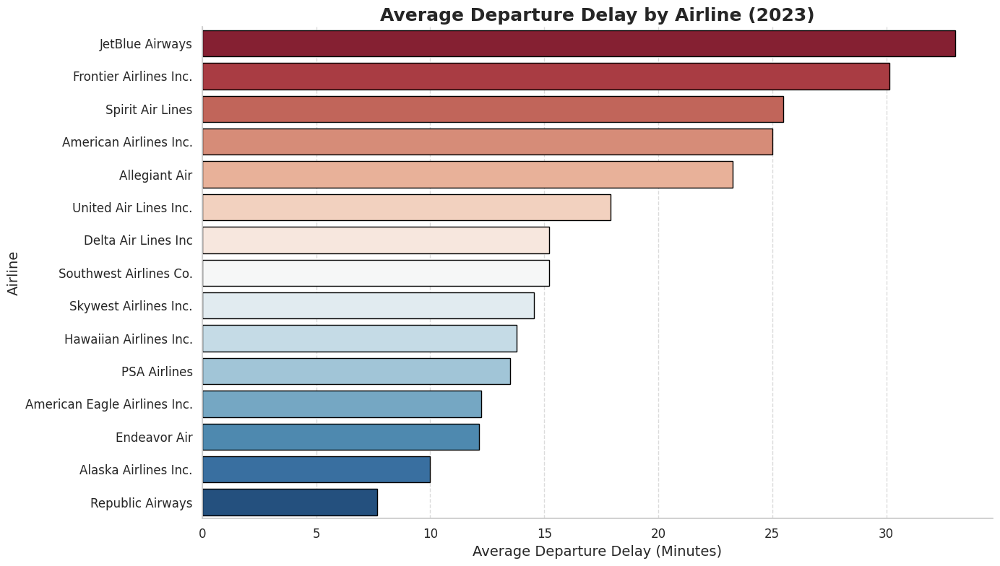

In [104]:
# Avg Departure Delay By Airline Company 
avg_dep_delay_by_airline = df.groupby('Airline')['Dep_Delay'].mean().sort_values(ascending=False)
plt.figure(figsize=(14, 8))  
sns.barplot(
    x=avg_dep_delay_by_airline.values, 
    y=avg_dep_delay_by_airline.index,
    palette='RdBu',  
    edgecolor='black' 
)

# Set titles and labels with larger fonts for clarity
plt.title('Average Departure Delay by Airline (2023)', fontsize=18, fontweight='bold')
plt.xlabel('Average Departure Delay (Minutes)', fontsize=14)
plt.ylabel('Airline', fontsize=14)

plt.grid(axis='x', linestyle='--', alpha=0.7)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

sns.despine()

plt.tight_layout()

plt.show()

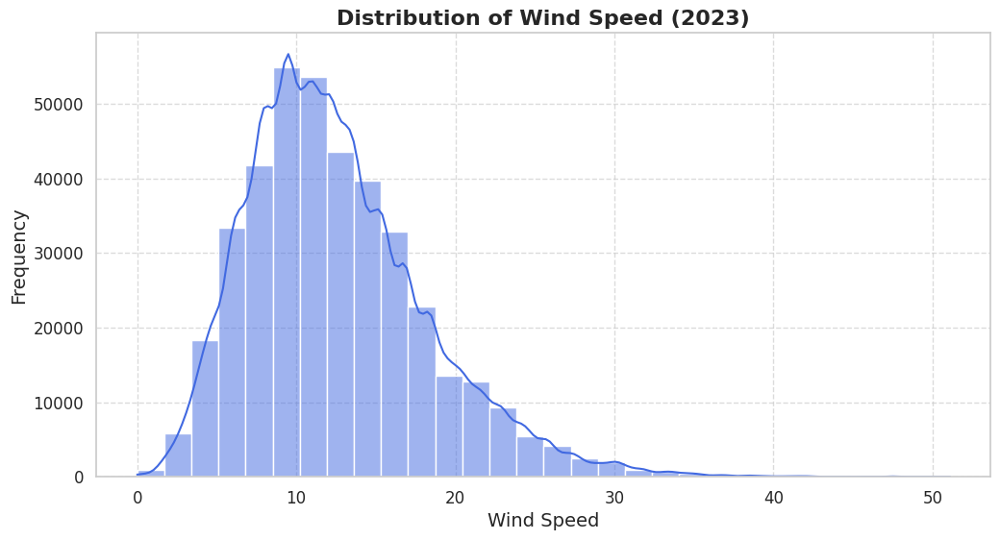

In [105]:
# Distribution of Wind Speed 

# Plot distribution of weather conditions (temperature)
plt.figure(figsize=(12, 6))

sns.histplot(df['wspd'], bins=30, kde=True, color='royalblue', palette='viridis')

plt.grid(True, linestyle='--', alpha=0.7)

# Customize labels and title
plt.title('Distribution of Wind Speed (2023)', fontsize=16, fontweight='bold')
plt.xlabel('Wind Speed', fontsize=14)
plt.ylabel('Frequency', fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.show()

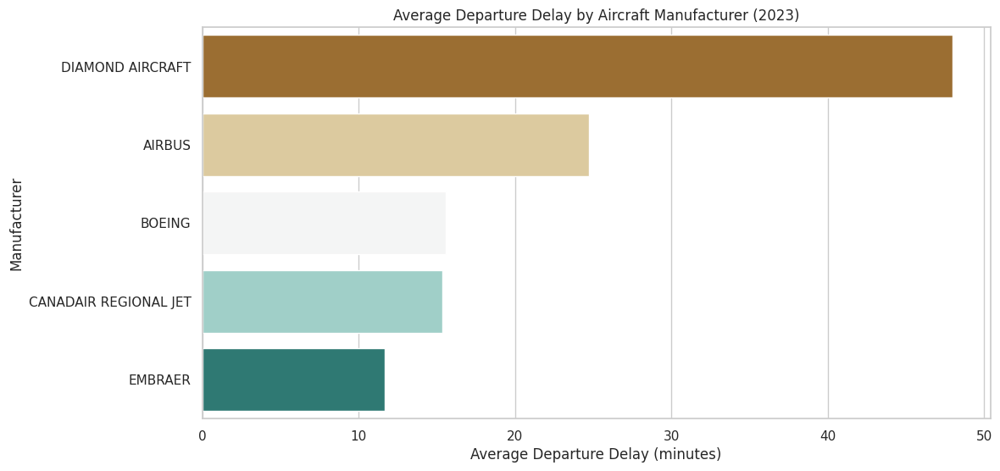

In [106]:
# Avg Dep_Delay by manufacturer 
avg_delay_by_manufacturer = df.groupby('Manufacturer')['Dep_Delay'].mean().sort_values(ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x=avg_delay_by_manufacturer.values, y=avg_delay_by_manufacturer.index, palette='BrBG')
plt.title('Average Departure Delay by Aircraft Manufacturer (2023)')
plt.xlabel('Average Departure Delay (minutes)')
plt.ylabel('Manufacturer')
plt.show()

# Handling Skewness & Outliers

In [107]:
df_skew = df.copy()

In [108]:
df_skew = df_skew.drop(["FlightDate", "Arr_Delay", "Dep_Delay"], axis=1)

In [109]:
numerical_cols = [col for col in df_skew.columns if df_skew[col].dtype != "object"]
categorical_cols = [col for col in df_skew.columns if df_skew[col].dtype == "object"]

In [110]:
def get_best_threshold(z):
    for i in np.arange(3,5,0.2):
        data = df_skew.copy()
        data = data[(z < i).all(axis=1)]
        loss = (df.shape[0] - data.shape[0]) / df_skew.shape[0]*100
        print(f'Loss: {loss:.2}% when threshold is {i}')

In [111]:
from scipy.stats import zscore, skew, boxcox
z = np.abs(zscore(df[numerical_cols]))
get_best_threshold(z)

Loss: 1.2e+01% when threshold is 3.0
Loss: 1e+01% when threshold is 3.2
Loss: 7.6% when threshold is 3.4000000000000004
Loss: 6.6% when threshold is 3.6000000000000005
Loss: 5.8% when threshold is 3.8000000000000007
Loss: 5.4% when threshold is 4.000000000000001
Loss: 4.7% when threshold is 4.200000000000001
Loss: 4.3% when threshold is 4.400000000000001
Loss: 4.0% when threshold is 4.600000000000001
Loss: 3.7% when threshold is 4.800000000000002


In [112]:
# Function to plot the distribution and calculate skewness
def plot_skewness(df, column):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(df_skew[column], kde=True, palette='coolwarm')
    plt.title(f'Distribution of {column} (Skewness: {skew(df_skew[column])})')

    plt.subplot(1, 2, 2)
    sns.boxplot(df_skew[column], palette='coolwarm')
    plt.title(f'Boxplot of {column}')

    plt.tight_layout()
    plt.show()

In [113]:
# Initial skewness check
skewness_before = df_skew[numerical_cols].apply(skew)
print("Skewness before transformation:\n", skewness_before)

Skewness before transformation:
 Day_Of_Week           -0.003564
Dep_Delay_Tag          0.000000
Flight_Duration        1.364106
Delay_Carrier         19.159348
Delay_Weather         38.816371
Delay_NAS             21.881029
Delay_Security        84.558687
Delay_LastAircraft    14.082977
Aicraft_age            0.296396
tavg                  -0.412045
tmin                  -0.403037
tmax                  -0.425724
prcp                  13.493483
snow                  16.418873
wdir                  -0.155627
wspd                   0.892116
pres                   0.127574
LATITUDE              -0.187531
LONGITUDE             -0.632972
Month                 -0.024586
Day                   -0.005158
Quarter               -0.030540
dtype: float64



Processing column: Flight_Duration


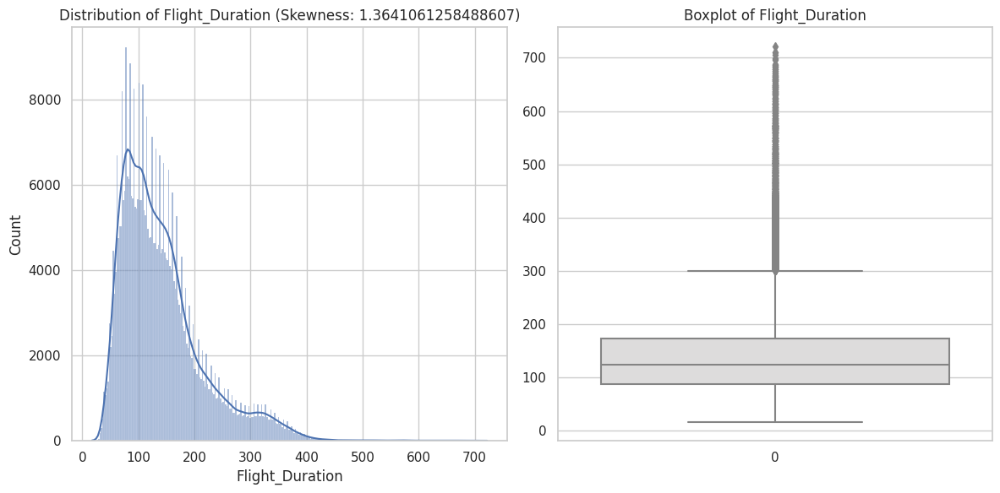

Log transformation skewness: 0.12031016086622955
Square Root transformation skewness: 0.7133305940399222
Box-Cox transformation skewness: 0.0054755195204900745
Best transformation for Flight_Duration: Box-Cox


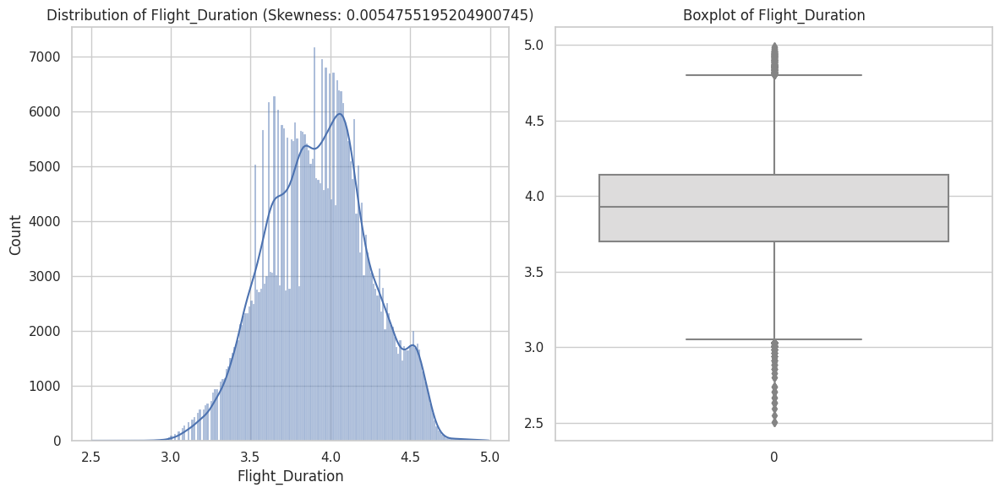


Processing column: Delay_Carrier


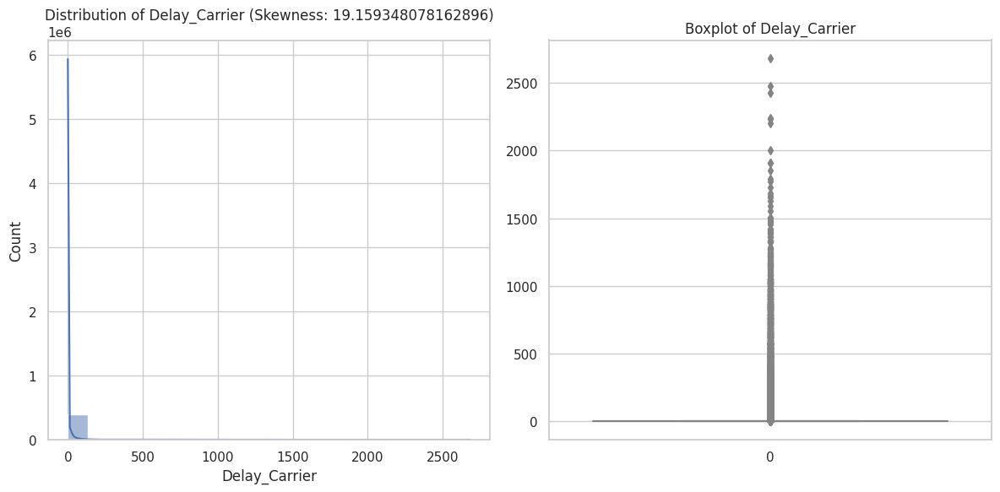

Square Root transformation skewness: 4.870041293684048
Best transformation for Delay_Carrier: Square Root


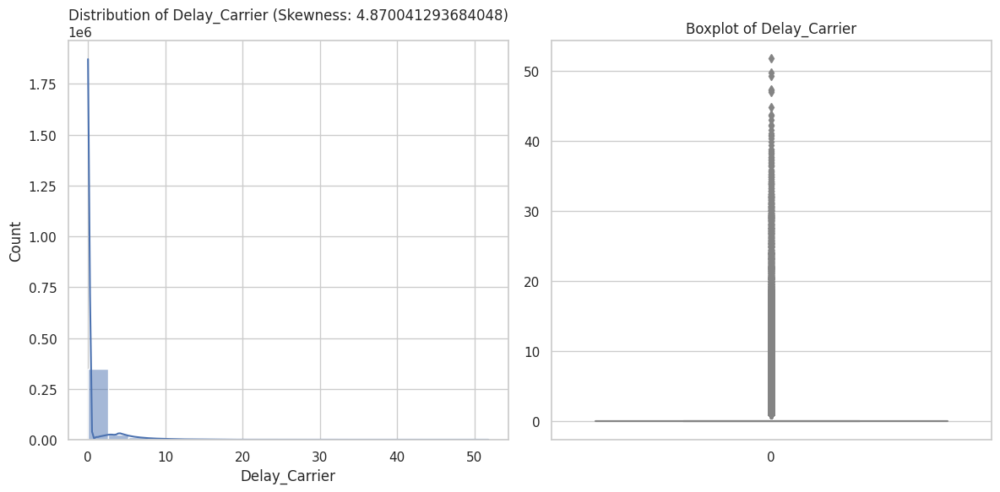


Processing column: Delay_Weather


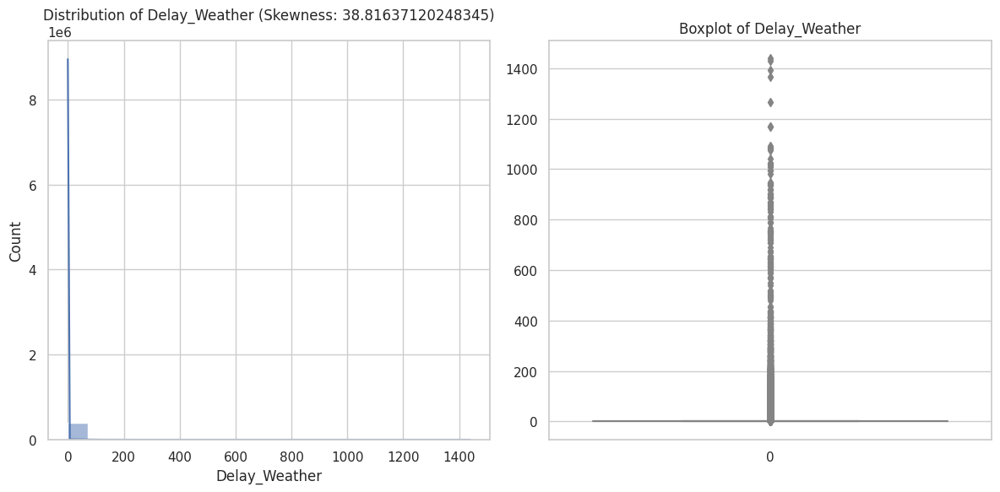

Square Root transformation skewness: 14.076222112954838
Best transformation for Delay_Weather: Square Root


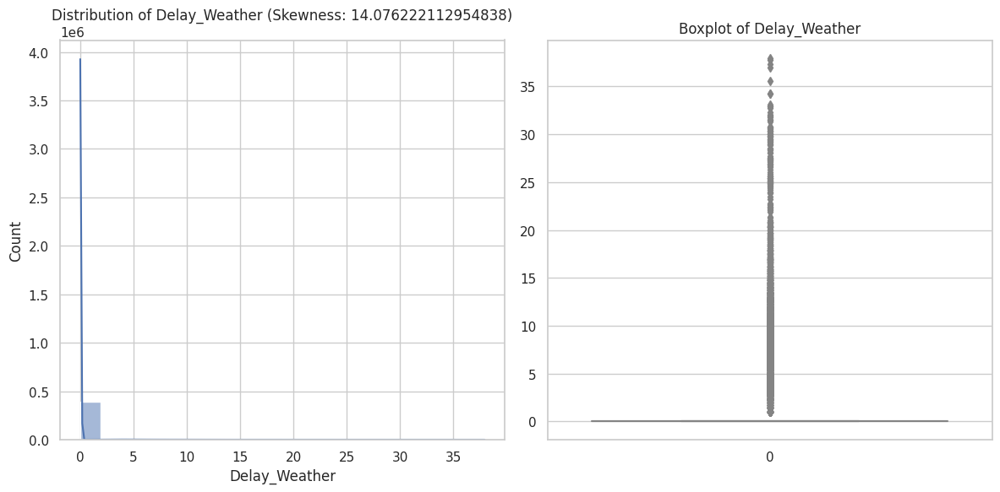


Processing column: Delay_NAS


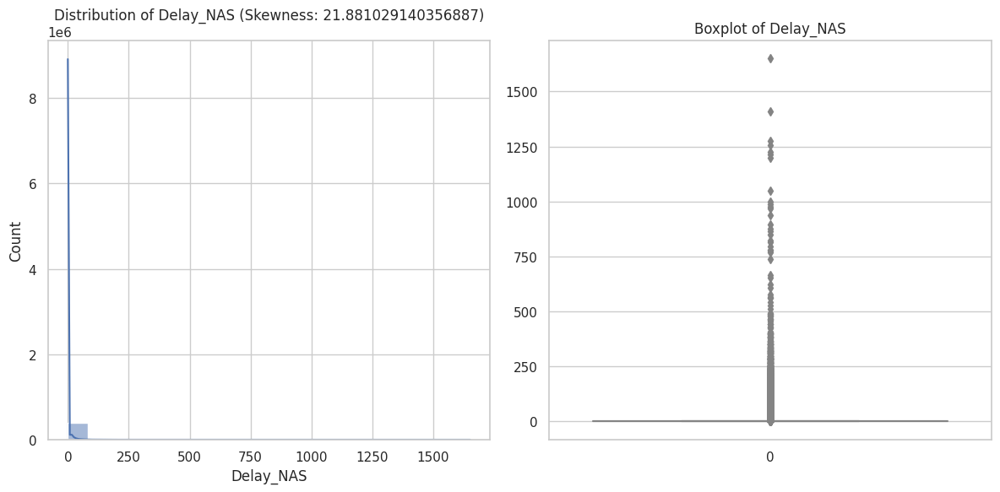

Square Root transformation skewness: 4.450624235655521
Best transformation for Delay_NAS: Square Root


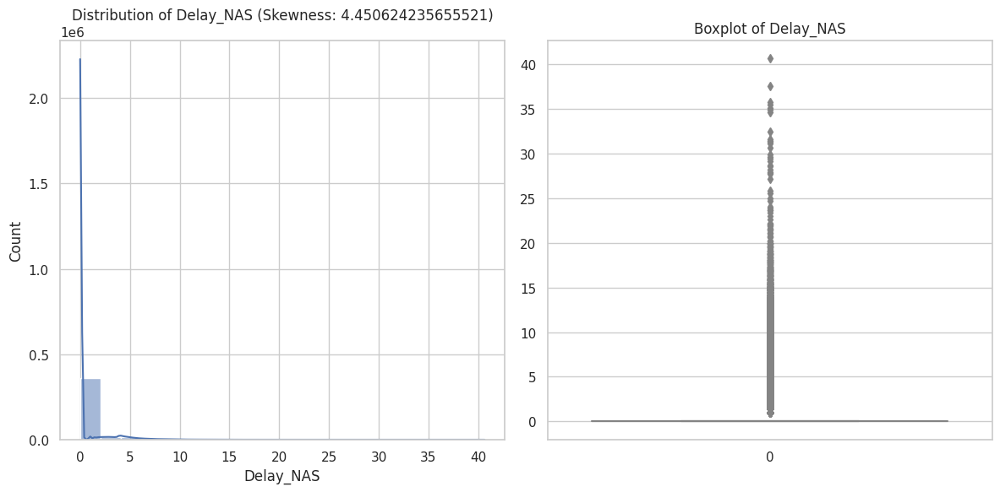


Processing column: Delay_Security


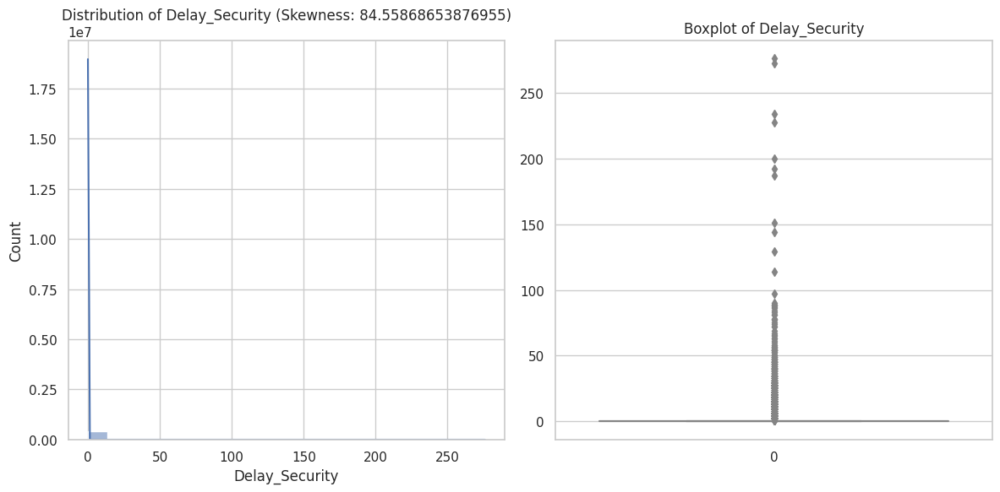

Square Root transformation skewness: 33.43217350461948
Best transformation for Delay_Security: Square Root


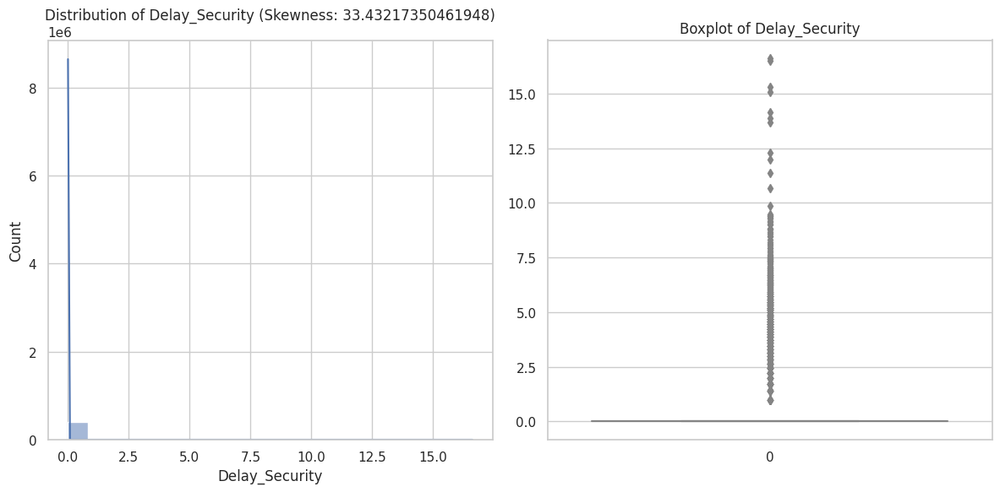


Processing column: Delay_LastAircraft


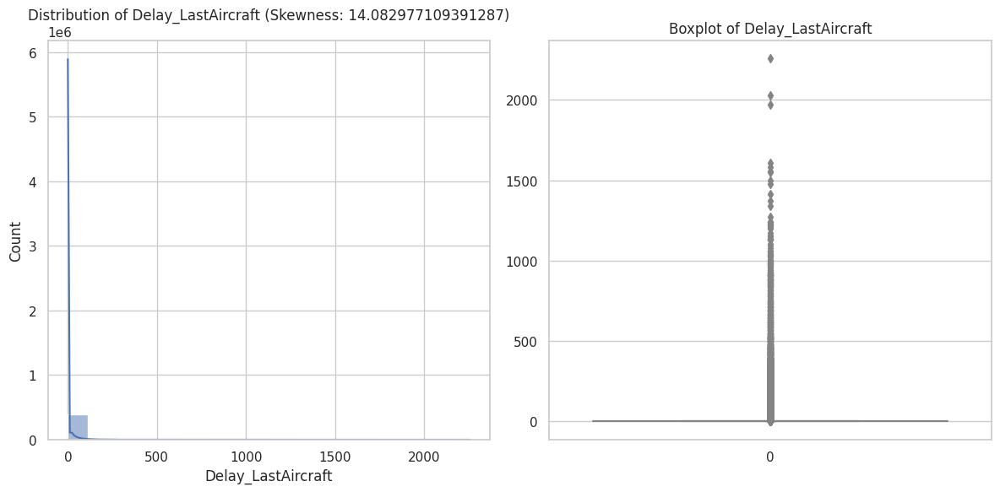

Square Root transformation skewness: 3.77440133889038
Best transformation for Delay_LastAircraft: Square Root


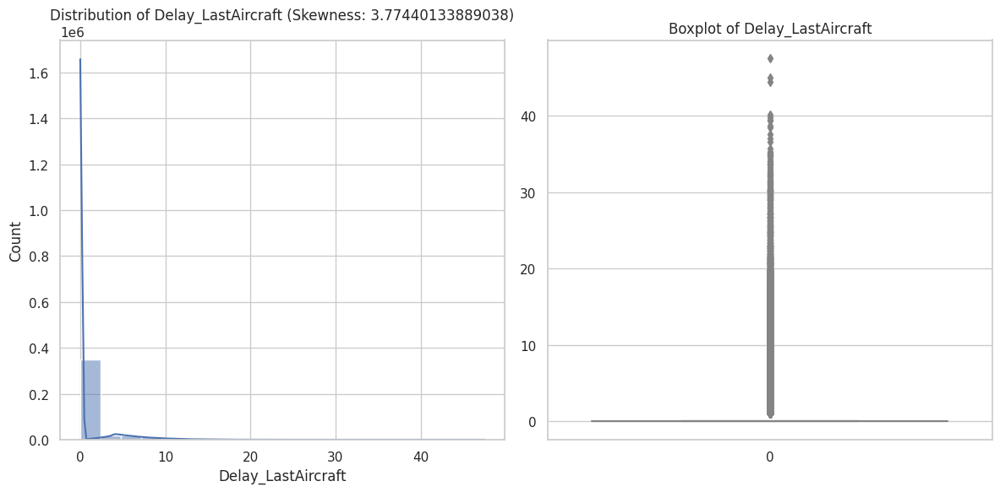


Processing column: tavg


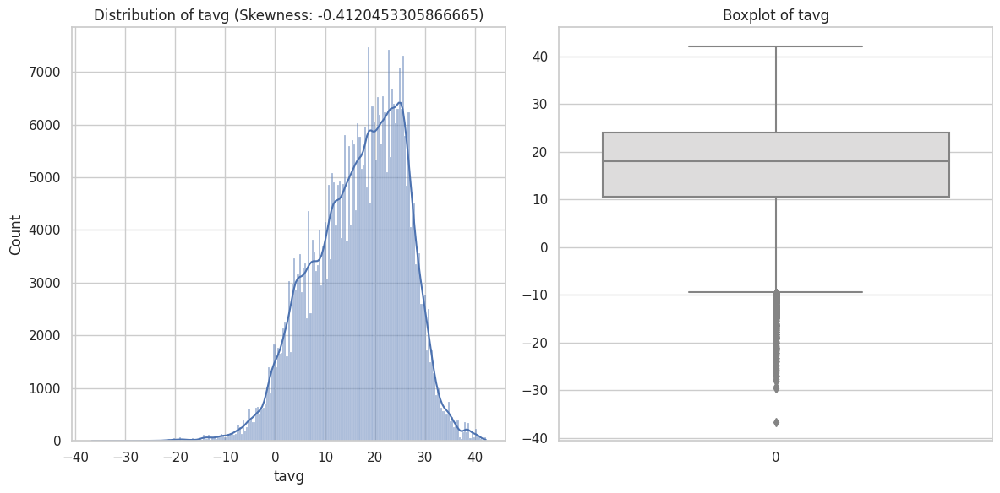

Square Root transformation skewness: nan
Best transformation for tavg: None


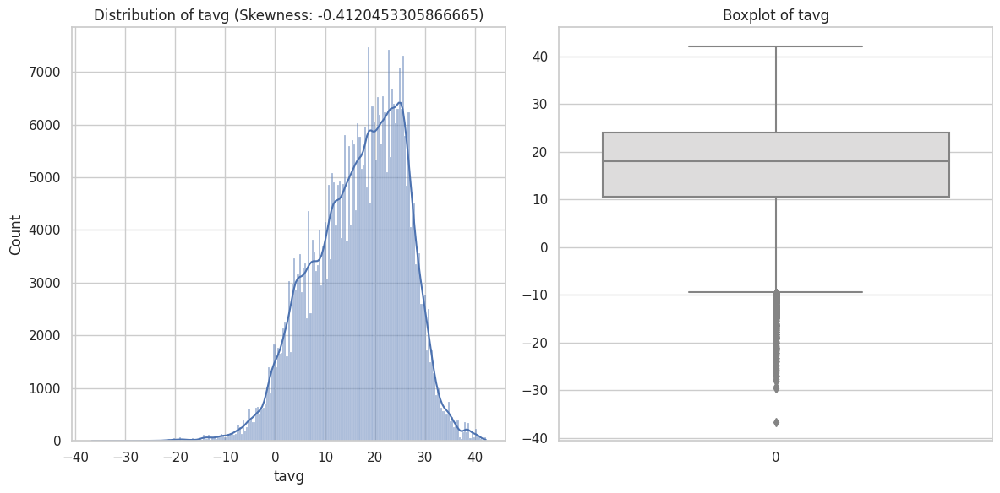


Processing column: tmin


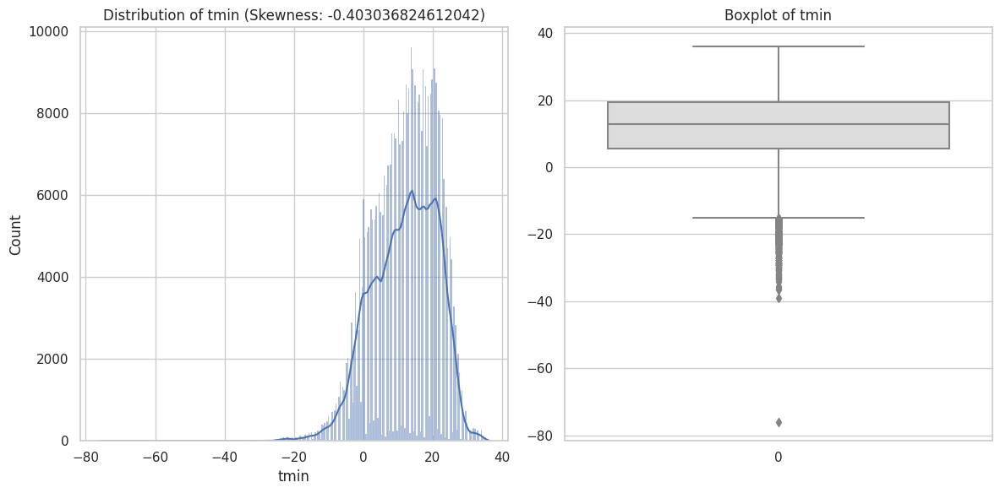

Square Root transformation skewness: nan
Best transformation for tmin: None


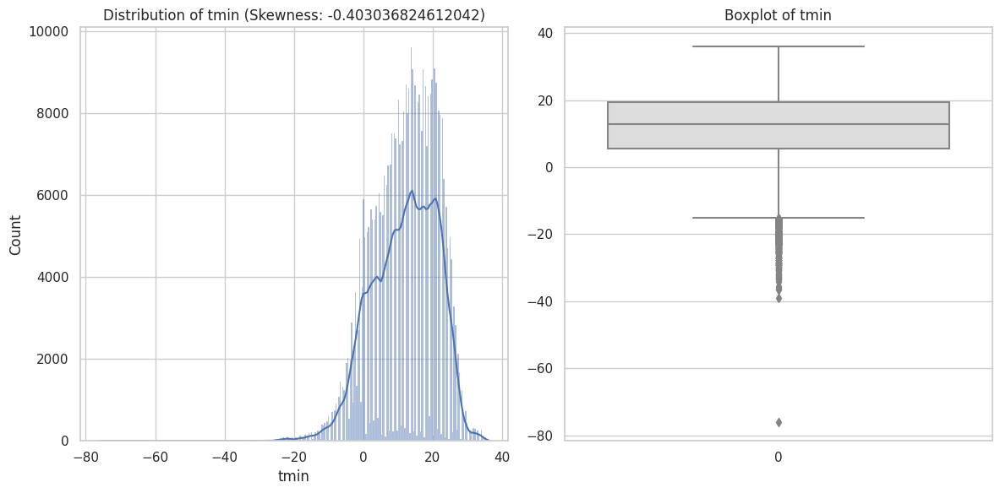


Processing column: tmax


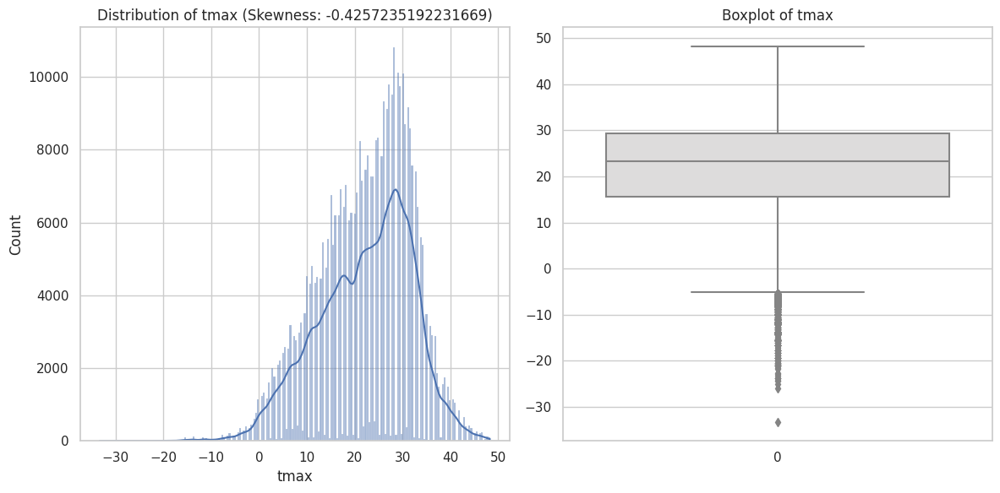

Square Root transformation skewness: nan
Best transformation for tmax: None


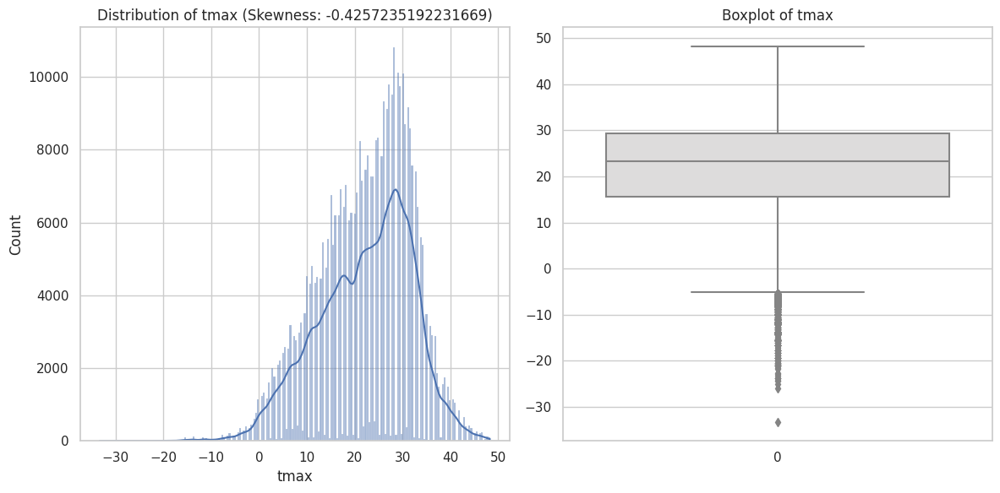


Processing column: prcp


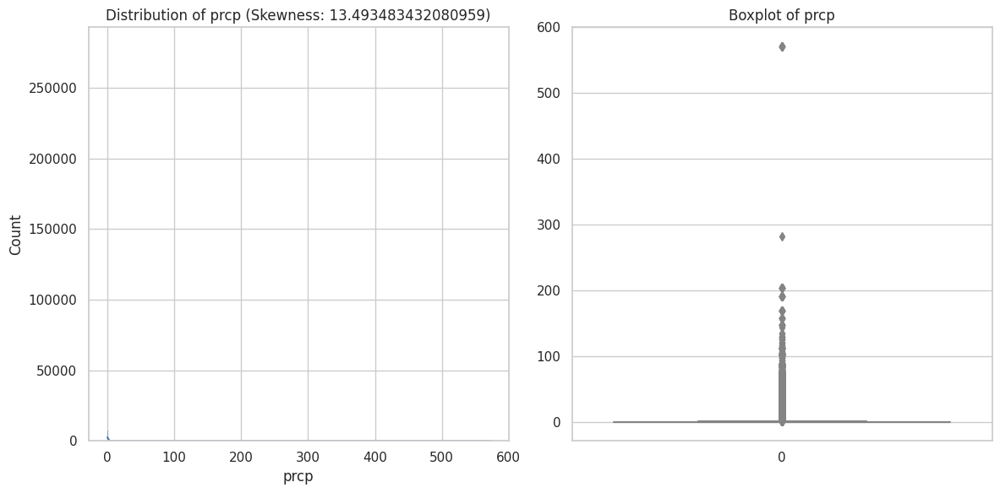

Square Root transformation skewness: 2.661502799021013
Best transformation for prcp: Square Root


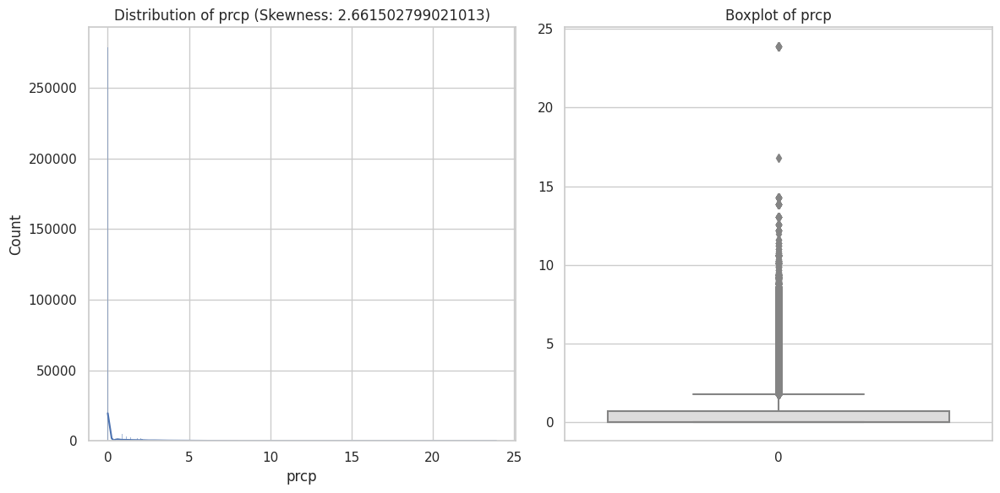


Processing column: snow


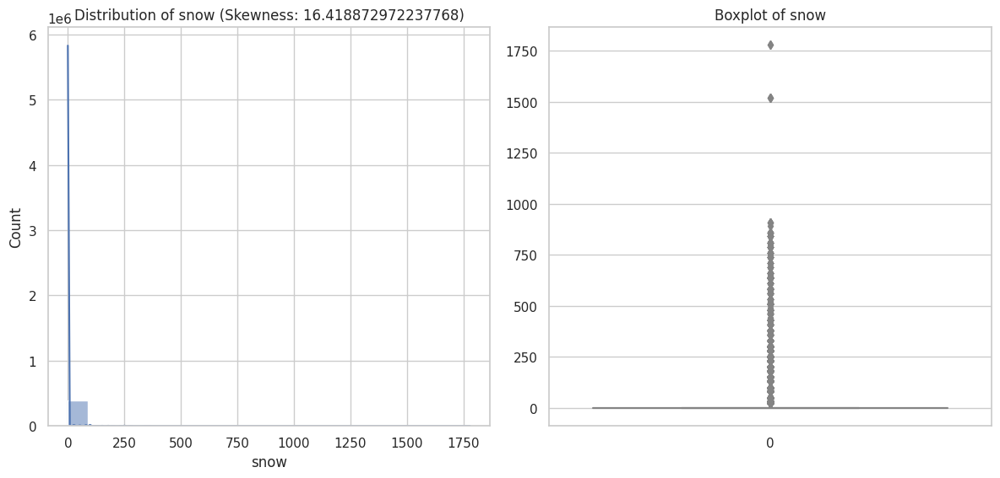

Square Root transformation skewness: 8.67686392144659
Best transformation for snow: Square Root


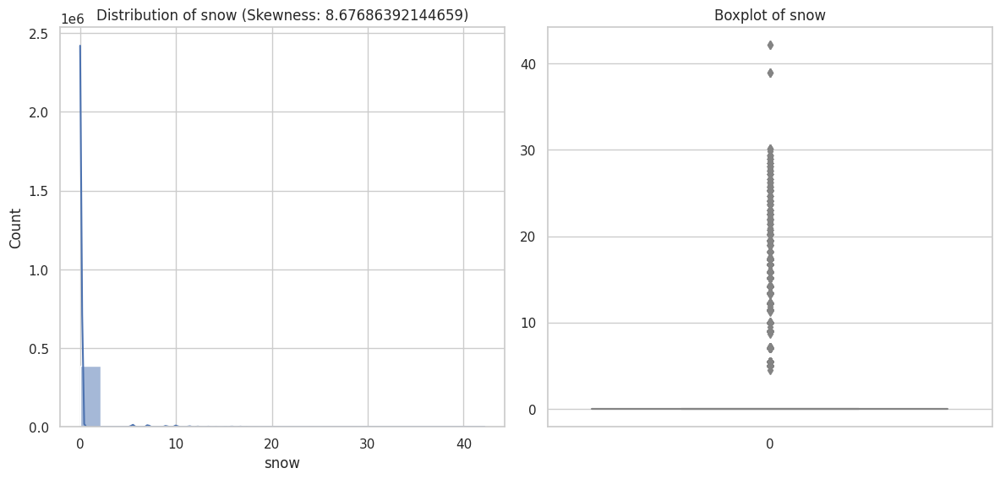


Processing column: wspd


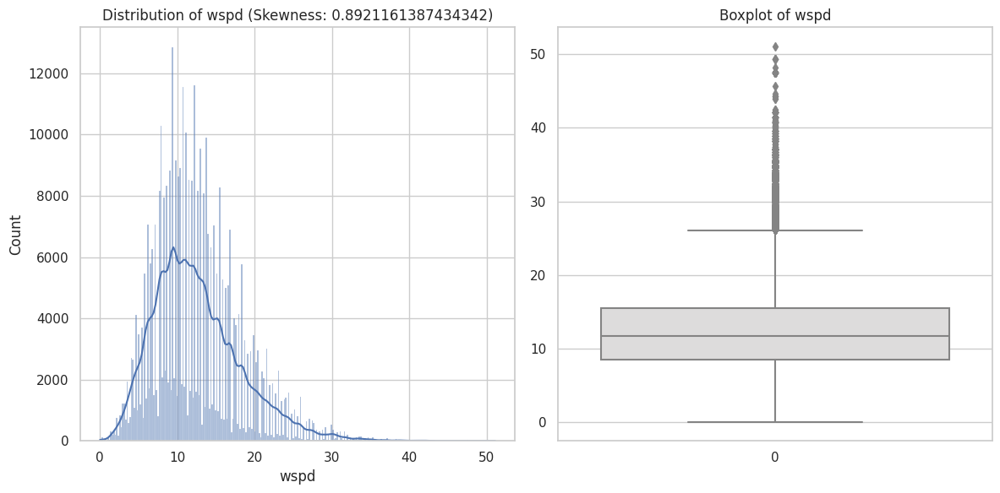

Square Root transformation skewness: 0.18383659226597762
Best transformation for wspd: Square Root


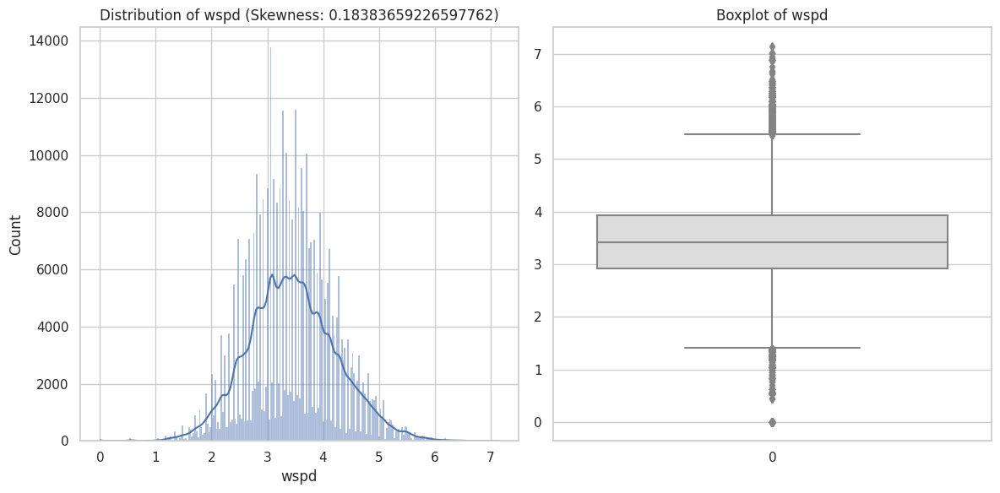


Processing column: LONGITUDE


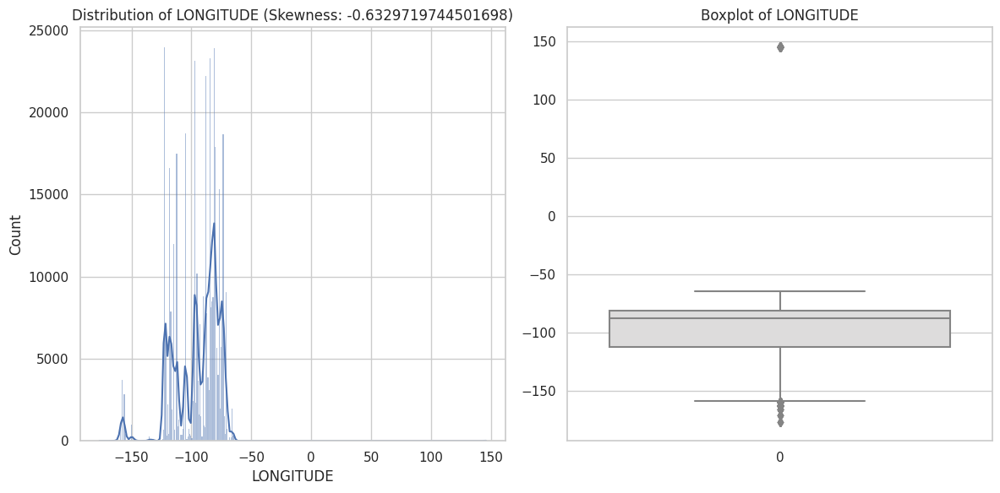

Square Root transformation skewness: nan
Best transformation for LONGITUDE: None


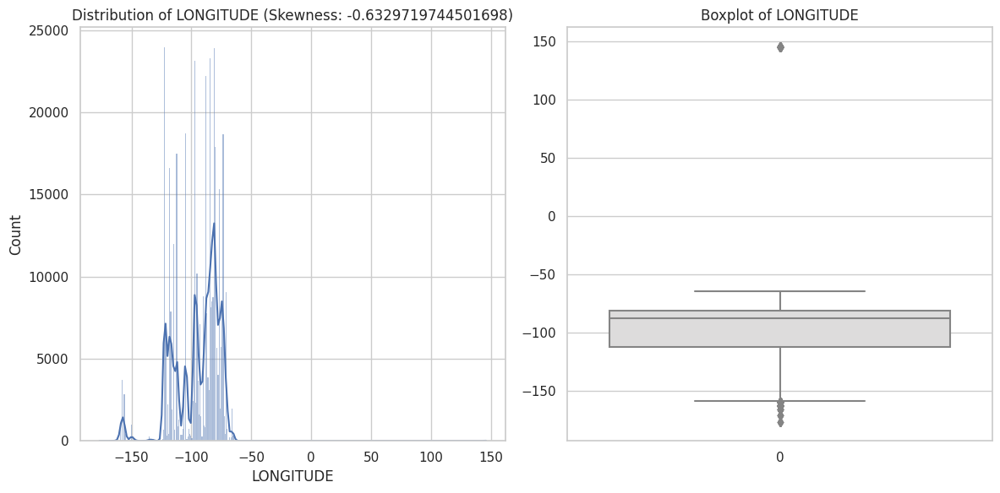

In [114]:
# Identify highly skewed columns
highly_skewed_columns = skewness_before[np.abs(skewness_before) > 0.4].index

# Apply transformations and compare skewness

best_transformations = {}

for col in highly_skewed_columns:
    print(f"\nProcessing column: {col}")
    plot_skewness(df_skew, col)

    # Original Skewness
    original_skewness = skew(df_skew[col])

    # 1. Log Transformation
    if (df_skew[col] > 0).all():  # Log transform is only applicable if all values are positive
        log_transformed = np.log1p(df_skew[col])
        log_skewness = skew(log_transformed)
        print(f"Log transformation skewness: {log_skewness}")
    else:
        log_skewness = np.inf

    # 2. Square Root Transformation
    sqrt_transformed = np.sqrt(df_skew[col])
    sqrt_skewness = skew(sqrt_transformed)
    print(f"Square Root transformation skewness: {sqrt_skewness}")

    # 3. Box-Cox Transformation (only if values are positive)
    if (df_skew[col] > 0).all():
        boxcox_transformed, _ = boxcox(df_skew[col] + 1e-6)  # Add small value to handle zeros
        boxcox_skewness = skew(boxcox_transformed)
        print(f"Box-Cox transformation skewness: {boxcox_skewness}")
    else:
        boxcox_skewness = np.inf


    # Compare and choose the best transformation
    best_transformation = min(
        (original_skewness, 'None'),
        (log_skewness, 'Log'),
        (sqrt_skewness, 'Square Root'),
        (boxcox_skewness, 'Box-Cox'),
        key=lambda x: abs(x[0])
    )
    best_transformations[col] = best_transformation[1]
    print(f"Best transformation for {col}: {best_transformations[col]}")

    # Plot the best transformation
    if best_transformation[1] == 'Log':
        df_skew[col] = log_transformed
    elif best_transformation[1] == 'Square Root':
        df_skew[col] = sqrt_transformed
    elif best_transformation[1] == 'Box-Cox':
        df_skew[col] = boxcox_transformed


    plot_skewness(df_skew, col)

In [115]:
outlier_data_after = analyze_IQR_outliers(df_skew, numerical_cols)

No. of IQR outliers in 'Flight_Duration': 655
Percentage of outliers in 'Flight_Duration': 0.16%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Delay_Carrier': 61272
Percentage of outliers in 'Delay_Carrier': 15.32%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Delay_Weather': 5792
Percentage of outliers in 'Delay_Weather': 1.45%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Delay_NAS': 47689
Percentage of outliers in 'Delay_NAS': 11.92%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Delay_Security': 659
Percentage of outliers in 'Delay_Security': 0.16%
--------------------------------------------------------------------------------
No. of IQR outliers in 'Delay_LastAircraft': 55812
Percentage of outliers in 'Delay_LastAircraft': 13.95%
-------------------

# Modeling

## Classification

In [116]:
classification_models = [
    BaggingClassifier(random_state=42),
    LogisticRegression(random_state=42),
    # SVC(random_state=42),
    GaussianNB(),
    RandomForestClassifier(random_state=42),
    DecisionTreeClassifier(random_state=42),
    GradientBoostingClassifier(random_state=42),
    AdaBoostClassifier(random_state=42),
    XGBClassifier(random_state=42),
    XGBRFClassifier(random_state=42),
    LGBMClassifier(random_state=42)
    # KNeighborsClassifier(n_neighbors=5),
]

In [117]:
# Split to X, y

X = df.drop(columns=['Dep_Delay_Tag', "Dep_Delay", "FlightDate", "Tail_Number", "Dep_Airport", "Dep_CityName", "AIRPORT", "CITY"])  # Features

# ["Quarter","Tail_Number", "AIRPORT", "CITY","STATE","LATITUDE","LONGITUDE", "tmin", "tmax"]

y = df['Dep_Delay_Tag']  # Target variable

In [118]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

In [119]:
# X_train[X_train["Tail_Number"] == "N667UA"]
# X_train[X_train["Arr_Airport"] == "PUB"]
# X_train[X_train["Arr_CityName"] == "Pueblo, CO"]

In [120]:
cat_cols = [col for col in X_train.columns if X_train[col].dtype == "object"]
num_cols = [col for col in X_train.columns if X_train[col].dtype != "object"]

In [121]:
X_train_encoded, X_test_encoded = encode_data(X_train, X_test)

In [122]:
y_train_encoded , y_test_encoded = encode_target(y_train, y_test)

In [123]:
models_class_no_s, trained_no_s = evaluate_classification_models(X_train_encoded, y_train_encoded, X_test_encoded, y_test_encoded,
                                                             classification_models)

BaggingClassifier(random_state=42) is ready
LogisticRegression(random_state=42) is ready
GaussianNB() is ready
RandomForestClassifier(random_state=42) is ready
DecisionTreeClassifier(random_state=42) is ready
GradientBoostingClassifier(random_state=42) is ready
AdaBoostClassifier(random_state=42) is ready
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=Non

In [124]:
models_class_no_s.iloc[:, :-1]

,Test_Accuracy,Train_Accuracy,ROC_AUC,F1_Score,Precision,Recall,Inference Time (ms)
Model-Name,,,,,,,
XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,446.378708
LGBMClassifier,83.65125,83.911563,0.836512,0.835760,0.889201,0.768825,3098.417521
RandomForestClassifier,83.42375,100.000000,0.834238,0.833475,0.886547,0.766575,13593.798161
GradientBoostingClassifier,82.93250,82.868750,0.829325,0.828765,0.871867,0.772125,1015.603065
AdaBoostClassifier,82.51500,82.427813,0.825150,0.824339,0.876287,0.757200,2949.468136
XGBRFClassifier,82.32625,82.324062,0.823262,0.822290,0.879405,0.749275,424.309492
BaggingClassifier,82.08125,98.782187,0.820813,0.819916,0.873505,0.750275,1644.690990
LogisticRegression,79.82500,79.672813,0.798250,0.797929,0.824097,0.758375,53.738832
GaussianNB,77.60125,77.511562,0.776012,0.765476,0.979126,0.564050,162.339211


In [125]:
X_train_ss, X_test_ss = scale_data(X_train_encoded, X_test_encoded, scaler_type="standard")

In [126]:
models_class_ss, trained_ss = evaluate_classification_models(X_train_ss, y_train_encoded, X_test_ss, y_test_encoded,
                                                             classification_models)
models_class_ss.iloc[:, :-1]

BaggingClassifier(random_state=42) is ready
LogisticRegression(random_state=42) is ready
GaussianNB() is ready
RandomForestClassifier(random_state=42) is ready
DecisionTreeClassifier(random_state=42) is ready
GradientBoostingClassifier(random_state=42) is ready
AdaBoostClassifier(random_state=42) is ready
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=Non

,Test_Accuracy,Train_Accuracy,ROC_AUC,F1_Score,Precision,Recall,Inference Time (ms)
Model-Name,,,,,,,
XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,1025.952339
LGBMClassifier,83.68125,83.890312,0.836812,0.836061,0.889547,0.769125,3106.030941
RandomForestClassifier,83.42250,100.000000,0.834225,0.833461,0.886611,0.766475,13593.943596
GradientBoostingClassifier,82.93250,82.868750,0.829325,0.828765,0.871867,0.772125,1017.219067
AdaBoostClassifier,82.51500,82.427813,0.825150,0.824339,0.876287,0.757200,2945.339918
XGBRFClassifier,82.32625,82.324062,0.823262,0.822290,0.879405,0.749275,1136.188507
BaggingClassifier,82.08125,98.780937,0.820812,0.819914,0.873592,0.750175,1650.383949
LogisticRegression,81.75375,81.723750,0.817538,0.816744,0.865648,0.751750,55.774689
GaussianNB,77.56125,77.432500,0.775612,0.764786,0.982747,0.561075,166.479111


In [127]:
X_train_sm, X_test_sm = scale_data(X_train_encoded, X_test_encoded, scaler_type="minmax")

In [128]:
models_class_mm, trained_mm = evaluate_classification_models(X_train_sm, y_train_encoded, X_test_sm, y_test_encoded,
                                                             classification_models)
models_class_mm.iloc[:, :-1]

BaggingClassifier(random_state=42) is ready
LogisticRegression(random_state=42) is ready
GaussianNB() is ready
RandomForestClassifier(random_state=42) is ready
DecisionTreeClassifier(random_state=42) is ready
GradientBoostingClassifier(random_state=42) is ready
AdaBoostClassifier(random_state=42) is ready
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=Non

,Test_Accuracy,Train_Accuracy,ROC_AUC,F1_Score,Precision,Recall,Inference Time (ms)
Model-Name,,,,,,,
XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,1012.187481
LGBMClassifier,83.64125,83.904687,0.836413,0.835647,0.889580,0.768175,3029.657364
RandomForestClassifier,83.40750,100.000000,0.834075,0.833313,0.886303,0.766475,13596.854448
GradientBoostingClassifier,82.93250,82.868750,0.829325,0.828765,0.871867,0.772125,1035.985708
AdaBoostClassifier,82.51500,82.427813,0.825150,0.824339,0.876287,0.757200,2926.516056
XGBRFClassifier,82.32625,82.324062,0.823262,0.822290,0.879405,0.749275,1012.049913
BaggingClassifier,82.07625,98.783125,0.820762,0.819868,0.873381,0.750300,1648.429155
GaussianNB,77.58875,77.540937,0.775888,0.765909,0.969936,0.569425,163.968801
DecisionTreeClassifier,77.25875,100.000000,0.772588,0.772567,0.767564,0.781975,181.794643


In [129]:
X_train_sr, X_test_sr = scale_data(X_train_encoded, X_test_encoded, scaler_type="robust")

In [130]:
models_class_rs, trained_rs = evaluate_classification_models(X_train_sr, y_train_encoded, X_test_sr, y_test_encoded,
                                                             classification_models)
models_class_rs.iloc[:, :-1]

BaggingClassifier(random_state=42) is ready
LogisticRegression(random_state=42) is ready
GaussianNB() is ready
RandomForestClassifier(random_state=42) is ready
DecisionTreeClassifier(random_state=42) is ready
GradientBoostingClassifier(random_state=42) is ready
AdaBoostClassifier(random_state=42) is ready
XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=Non

,Test_Accuracy,Train_Accuracy,ROC_AUC,F1_Score,Precision,Recall,Inference Time (ms)
Model-Name,,,,,,,
XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,1008.260250
LGBMClassifier,83.66875,83.894063,0.836688,0.835946,0.888998,0.769450,3088.346720
RandomForestClassifier,83.39375,100.000000,0.833937,0.833170,0.886356,0.766100,13859.591246
GradientBoostingClassifier,82.93250,82.868750,0.829325,0.828765,0.871867,0.772125,1026.151896
AdaBoostClassifier,82.51500,82.427813,0.825150,0.824339,0.876287,0.757200,2941.832066
XGBRFClassifier,82.32625,82.324062,0.823262,0.822290,0.879405,0.749275,1010.878801
BaggingClassifier,82.07000,98.784688,0.820700,0.819799,0.873537,0.749975,1661.804199
LogisticRegression,81.72125,81.675937,0.817213,0.816455,0.863995,0.752950,54.062605
GaussianNB,77.56625,77.451563,0.775662,0.764915,0.981612,0.561850,165.420055


In [131]:
models_class_no_s ["Scaler"] = "NO Scailing"
models_class_ss ["Scaler"] = "Standard Scaler"
models_class_mm ["Scaler"] = "MinMax Scaler"
models_class_rs ["Scaler"] = "Robust Scaler"

all_models = pd.concat([models_class_no_s, models_class_ss, models_class_mm, models_class_rs], axis=0)
all_models = all_models.drop(columns=["Prediction"])
all_models = all_models.sort_values(by="Test_Accuracy", ascending=False)
all_models

,Test_Accuracy,Train_Accuracy,ROC_AUC,F1_Score,Precision,Recall,Inference Time (ms),Scaler
Model-Name,,,,,,,,
XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,446.378708,NO Scailing
XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,1025.952339,Standard Scaler
XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,1008.260250,Robust Scaler
XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,1012.187481,MinMax Scaler
LGBMClassifier,83.68125,83.890312,0.836812,0.836061,0.889547,0.769125,3106.030941,Standard Scaler
LGBMClassifier,83.66875,83.894063,0.836688,0.835946,0.888998,0.769450,3088.346720,Robust Scaler
LGBMClassifier,83.65125,83.911563,0.836512,0.835760,0.889201,0.768825,3098.417521,NO Scailing
LGBMClassifier,83.64125,83.904687,0.836413,0.835647,0.889580,0.768175,3029.657364,MinMax Scaler
RandomForestClassifier,83.42375,100.000000,0.834238,0.833475,0.886547,0.766575,13593.798161,NO Scailing


### Best Models

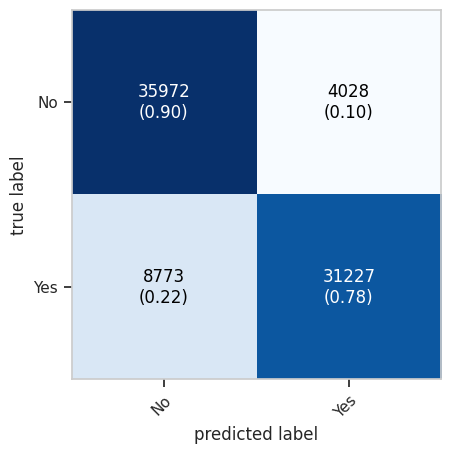

In [132]:
xgb_result = evaluate_classification_metrics(y_test_encoded, models_class_no_s["Prediction"][0], target_names=["No","Yes"], display=False)

In [133]:
print(xgb_result['Classification Report'])

              precision    recall  f1-score   support

          No       0.80      0.90      0.85     40000
         Yes       0.89      0.78      0.83     40000

    accuracy                           0.84     80000
   macro avg       0.84      0.84      0.84     80000
weighted avg       0.84      0.84      0.84     80000



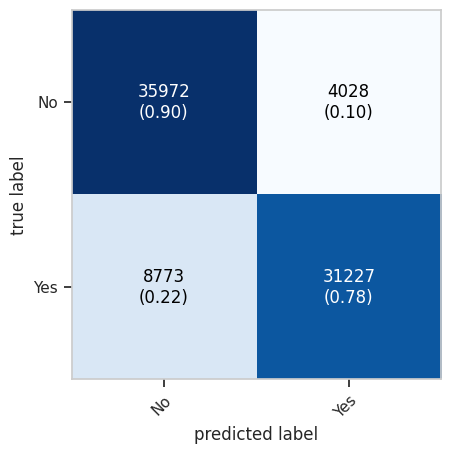

In [134]:
lgbm_result = evaluate_classification_metrics(y_test_encoded, models_class_ss["Prediction"][0], target_names=["No","Yes"], display=False)

In [135]:
print(lgbm_result["Classification Report"])

              precision    recall  f1-score   support

          No       0.80      0.90      0.85     40000
         Yes       0.89      0.78      0.83     40000

    accuracy                           0.84     80000
   macro avg       0.84      0.84      0.84     80000
weighted avg       0.84      0.84      0.84     80000



In [136]:
results_df = all_models.reset_index()
results_df

,Model-Name,Test_Accuracy,Train_Accuracy,ROC_AUC,F1_Score,Precision,Recall,Inference Time (ms),Scaler
0,XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,446.378708,NO Scailing
1,XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,1025.952339,Standard Scaler
2,XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,1008.260250,Robust Scaler
3,XGBClassifier,83.99875,84.990000,0.839987,0.839423,0.885747,0.780675,1012.187481,MinMax Scaler
4,LGBMClassifier,83.68125,83.890312,0.836812,0.836061,0.889547,0.769125,3106.030941,Standard Scaler
5,LGBMClassifier,83.66875,83.894063,0.836688,0.835946,0.888998,0.769450,3088.346720,Robust Scaler
6,LGBMClassifier,83.65125,83.911563,0.836512,0.835760,0.889201,0.768825,3098.417521,NO Scailing
7,LGBMClassifier,83.64125,83.904687,0.836413,0.835647,0.889580,0.768175,3029.657364,MinMax Scaler
8,RandomForestClassifier,83.42375,100.000000,0.834238,0.833475,0.886547,0.766575,13593.798161,NO Scailing
9,RandomForestClassifier,83.42250,100.000000,0.834225,0.833461,0.886611,0.766475,13593.943596,Standard Scaler


In [137]:
model = trained_no_s["XGBClassifier"]

In [138]:
import pickle

# Save the trained model
with open('xgb_class_model.pkl', 'wb') as f:
    pickle.dump(model, f)

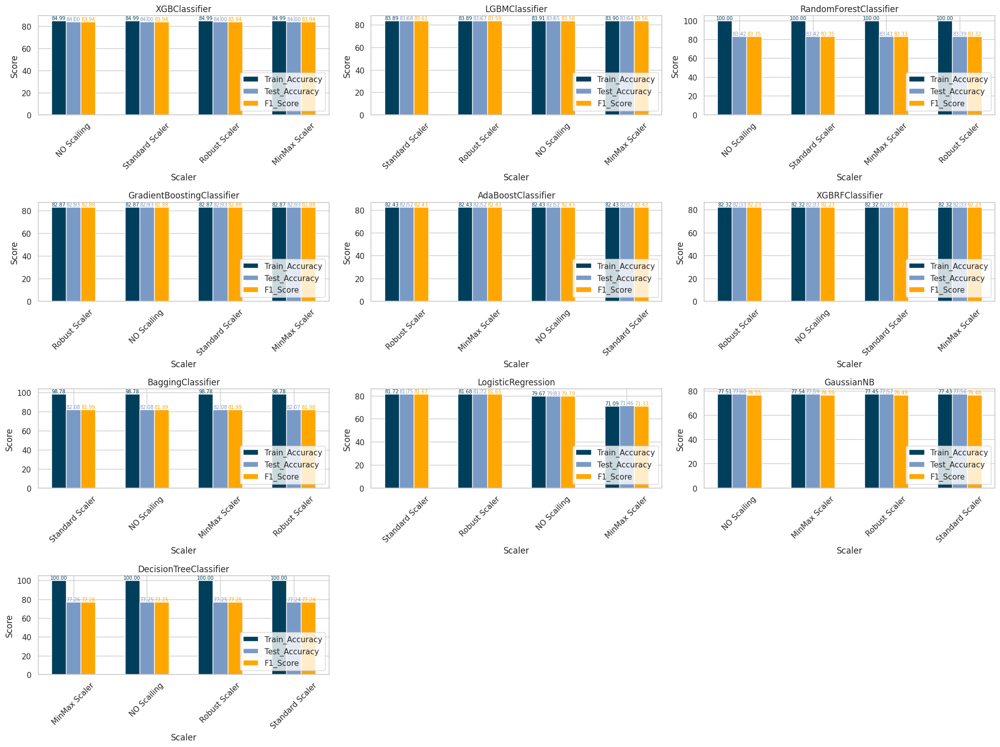

In [139]:
# Update to include both accuracy and F1 score for visualization
fig_width = 20
fig_height = 15
models = results_df['Model-Name'].unique()
n_models = len(models)
n_cols = 3
n_rows = (n_models + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(fig_width, fig_height), tight_layout=True)

axes = axes.flatten()

train_color_acc = '#003f5c'
test_color_acc = '#7a9ac6'
train_color_f1 = '#bc5090'
test_color_f1 = '#ffa600'

for ax, model in zip(axes, models):
    model_df = results_df[results_df['Model-Name'] == model]

    scalers = model_df['Scaler']
    bar_width = 0.2  # Adjusted bar width to fit all bars
    index = np.arange(len(scalers))

    # Plot Accuracy bars
    train_acc_bars = ax.bar(index - bar_width, model_df['Train_Accuracy'], bar_width, label='Train_Accuracy', color=train_color_acc)
    test_acc_bars = ax.bar(index, model_df['Test_Accuracy'], bar_width, label='Test_Accuracy', color=test_color_acc)

    # Plot F1 Score bars
    test_f1_bars = ax.bar(index + bar_width, model_df['F1_Score']*100, bar_width, label='F1_Score', color=test_color_f1)

    ax.set_xlabel('Scaler')
    ax.set_ylabel('Score')
    ax.set_title(model)
    ax.set_xticks(index)
    ax.set_xticklabels(scalers, rotation=45)
    ax.legend()

    # Add text above bars for Accuracy
    for bar in train_acc_bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', ha='center', va='bottom', fontsize=7, color=train_color_acc)
        ax.legend(loc='lower right')

    for bar in test_acc_bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', ha='center', va='bottom', fontsize=7, color=test_color_acc)
        ax.legend(loc='lower right')

    for bar in test_f1_bars:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, yval, f'{yval:.2f}', ha='center', va='bottom', fontsize=7, color=test_color_f1)
        ax.legend(loc='lower right')

# Remove any unused subplots
for i in range(len(models), len(axes)):
    fig.delaxes(axes[i])


plt.tight_layout()
plt.show()

## Regression

In [140]:
xgb_pred = models_class_no_s["Prediction"][0]
xgb_pred[xgb_pred == 1]

array([1, 1, 1, ..., 1, 1, 1])

In [141]:
# Create a DataFrame with the predicted values and the corresponding indices.
xgb_pred_df = pd.DataFrame(xgb_pred, columns=['prediction'])
xgb_pred_df.index = y_test_encoded.index

# Filter the predicted values where the prediction is equal to 1.
delay_pred_indices = xgb_pred_df[xgb_pred_df['prediction'] == 1].index

# Select the corresponding y_test values based on the filtered indices.
y_test_filtered = y_test_encoded.loc[delay_pred_indices]

# Combine the predicted values with the corresponding y_test values.
combined_df = pd.concat([y_test_filtered, xgb_pred_df.loc[delay_pred_indices]], axis=1)

In [142]:
combined_df.columns = ["y_test", "xgb_pred"]

In [143]:
pred_right = combined_df[combined_df["y_test"] == 1]
pred_right

,y_test,xgb_pred
358268,1,1
242904,1,1
40655,1,1
366404,1,1
118160,1,1
...,...,...
355179,1,1
52468,1,1
146104,1,1
94656,1,1


In [144]:
# Get the indices from pred_right
indices = pred_right.index

# Use the indices to select rows from df
df_reg = df.loc[indices]

In [145]:
df_reg.shape

(31227, 40)

In [146]:
# Split to X, y

X_reg = df_reg.drop(columns=['Dep_Delay_Tag', "Dep_Delay", "FlightDate", "Tail_Number", "STATE", "Arr_Airport",
                             "Dep_Airport", "Dep_CityName", "AIRPORT", "CITY", "Arr_CityName"])  # Features

# ["Quarter","Tail_Number","STATE","LATITUDE","LONGITUDE", "tmin", "tmax"]

y_reg = df_reg['Dep_Delay']  # Target variable

In [147]:
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg, y_reg, test_size=0.2, random_state=42)

In [148]:
cat_cols = [col for col in X_train_reg.columns if X_train_reg[col].dtype == "object"]
num_cols = [col for col in X_train_reg.columns if X_train_reg[col].dtype != "object"]

In [149]:
cat_cols

['Airline',
 'DepTime_label',
 'Dep_Delay_Type',
 'Arr_Delay_Type',
 'Distance_type',
 'Manufacturer',
 'Model']

In [150]:
X_train_reg_encoded, X_test_reg_encoded = encode_data(X_train_reg, X_test_reg)

In [151]:
regression_models = [
    LGBMRegressor(random_state=42),
    XGBRegressor(random_state=42),
    Lasso(),
    Ridge(),
    # ElasticNet(),
    RandomForestRegressor(random_state=42),
    BaggingRegressor(random_state=42),
    LinearRegression(),
    DecisionTreeRegressor(random_state=42),
    GradientBoostingRegressor(random_state=42),
    AdaBoostRegressor(random_state=42)
]

In [152]:
reg_models, trained_reg = evaluate_regression_models(X_train_reg_encoded, y_train_reg, X_test_reg_encoded, y_test_reg, regression_models)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012568 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3479
[LightGBM] [Info] Number of data points in the train set: 24981, number of used features: 29
[LightGBM] [Info] Start training from score 50.581242
LGBMRegressor(random_state=42) is ready
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=Non

In [153]:
reg = trained_reg["GradientBoostingRegressor"]

In [154]:
# Save the trained model
with open('gb_reg_model.pkl', 'wb') as f:
    pickle.dump(reg, f)

In [155]:
reg_models.iloc[:, :-1]

,RMSE,R2_Score,MAE,Inference Time (ms)
Model-Name,,,,
RandomForestRegressor,7.775396,99.163893,4.886793,198.779345
GradientBoostingRegressor,8.011948,99.112245,5.679474,12.837887
BaggingRegressor,8.208510,99.068151,5.112168,26.554585
DecisionTreeRegressor,10.992108,98.328990,6.691643,5.024195
LGBMRegressor,11.203162,98.264206,5.221853,41.761875
Ridge,13.552559,97.459849,9.402284,3.659248
LinearRegression,13.552592,97.459836,9.402531,3.486633
Lasso,13.980949,97.296725,9.565284,3.253937
XGBRegressor,15.998452,96.460248,5.630310,21.680593


In [156]:
last_pred = reg_models["Prediction"][0]

In [157]:
last_pred_df = pd.DataFrame(last_pred, columns=['prediction'])

In [158]:
# Create a DataFrame with the predicted values and the corresponding indices.
last_pred_df = pd.DataFrame(last_pred, columns=['prediction'])
last_pred_df.index = y_test_reg.index

# Combine the predicted values with the corresponding y_test values.
combined_df_reg = pd.concat([y_test_reg, last_pred_df], axis=1)
combined_df_reg.columns = ["y_test", "prediction"]

In [159]:
combined_df_reg

,y_test,prediction
347991,15,15.00
141080,27,22.65
12918,122,101.13
114688,37,40.79
216126,20,26.24
...,...,...
384379,34,24.34
307669,433,441.92
235731,49,52.05
81316,1,7.22


In [160]:
print("RMSE:", np.sqrt(mean_squared_error(combined_df_reg["y_test"], combined_df_reg["prediction"])))
print("R2 Score:", r2_score(combined_df_reg["y_test"], combined_df_reg["prediction"]))

RMSE: 7.775396123048459
R2 Score: 0.9916389268757172


In [161]:
# Create scatter plot for actual values (y_test) in blue
scatter_actual = go.Scatter(
    x=combined_df_reg["y_test"],
    y=combined_df_reg["y_test"],
    mode='markers',
    marker=dict(color='blue', size=6),
    name='Actual Delay'
)

# Create scatter plot for predicted values (prediction) in orange
scatter_predicted = go.Scatter(
    x=combined_df_reg["y_test"],
    y=combined_df_reg["prediction"],
    mode='markers',
    marker=dict(color='orange', size=6),
    name='Predicted Delay'
)

# Plot a red dashed line for the perfect fit (y_test = prediction)
line_fit = go.Scatter(
    x=[combined_df_reg["y_test"].min(), combined_df_reg["y_test"].max()],
    y=[combined_df_reg["y_test"].min(), combined_df_reg["y_test"].max()],
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='Perfect Fit'
)

# Create the layout
layout = go.Layout(
    title='Actual vs Predicted Departure Delay',
    xaxis=dict(title='Actual Delay'),
    yaxis=dict(title='Predicted Delay'),
    showlegend=True
)

# Combine the plots
fig = go.Figure(data=[scatter_predicted,scatter_actual, line_fit], layout=layout)

# Show the plot
fig.show()

## Regression Delay

In [162]:
df_reg.head()

,FlightDate,Day_Of_Week,Airline,Tail_Number,Dep_Airport,Dep_CityName,DepTime_label,Dep_Delay,Dep_Delay_Tag,Dep_Delay_Type,Arr_Airport,Arr_CityName,Arr_Delay,Arr_Delay_Type,Flight_Duration,Distance_type,Delay_Carrier,Delay_Weather,Delay_NAS,Delay_Security,Delay_LastAircraft,Manufacturer,Model,Aicraft_age,tavg,tmin,tmax,prcp,snow,wdir,wspd,pres,AIRPORT,CITY,STATE,LATITUDE,LONGITUDE,Month,Day,Quarter
358268,2023-11-11,6,Skywest Airlines Inc.,N616UX,LAX,"Los Angeles, CA",Evening,19,1,Medium >15min,SMF,"Sacramento, CA",-5,Low <5min,72,Short Haul >1500Mi,0,0,0,0,0,EMBRAER,170/175,5,16.8,10.0,25.0,0.0,0.0,357.0,8.6,1017.0,Los Angeles International Airport,Los Angeles,CA,33.94254,-118.40807,11,11,4
242904,2023-07-20,4,Republic Airways,N434YX,ACK,"Nantucket, MA",Afternoon,24,1,Medium >15min,DCA,"Washington, DC",50,Medium >15min,128,Short Haul >1500Mi,0,0,26,0,24,EMBRAER,170/175,10,20.8,18.9,26.0,0.0,0.0,141.0,11.9,1014.9,Nantucket Memorial Airport,Nantucket,MA,41.25305,-70.06018,7,20,3
40655,2023-07-06,4,Frontier Airlines Inc.,N329FR,SAN,"San Diego, CA",Morning,18,1,Medium >15min,CLE,"Cleveland, OH",20,Medium >15min,272,Medium Haul <3000Mi,18,0,2,0,0,AIRBUS,A320,6,18.2,16.1,21.1,0.0,0.0,314.0,9.0,1013.7,San Diego International Airport (Lindbergh Field),San Diego,CA,32.73356,-117.18966,7,6,3
366404,2023-09-01,5,American Airlines Inc.,N119US,SYR,"Syracuse, NY",Afternoon,8,1,Low <5min,CLT,"Charlotte, NC",18,Medium >15min,131,Short Haul >1500Mi,1,0,10,0,7,AIRBUS,A320,24,17.1,10.0,25.6,0.0,0.0,25.0,5.8,1024.5,Syracuse Hancock International Airport,Syracuse,NY,43.11119,-76.10631,9,1,3
118160,2023-01-16,1,Delta Air Lines Inc,N596NW,ATL,"Atlanta, GA",Morning,6,1,Low <5min,DTW,"Detroit, MI",3,Low <5min,114,Short Haul >1500Mi,0,0,0,0,0,BOEING,757,21,7.4,-1.7,16.7,0.0,0.0,327.0,3.7,1018.3,Hartsfield-Jackson Atlanta International Airport,Atlanta,GA,33.64044,-84.42694,1,16,1


In [163]:
# Split to X, y

X_arr = df_reg.drop(columns=['Dep_Delay_Tag', "Arr_Delay", "Dep_Delay", "FlightDate", "Tail_Number", "STATE", "Arr_Airport",
                             "Dep_Airport", "Dep_CityName", "AIRPORT", "CITY", "Arr_CityName"])  # Features

# ["Quarter","Tail_Number","STATE","LATITUDE","LONGITUDE", "tmin", "tmax"]

y_arr = df_reg['Arr_Delay']  # Target variable

In [164]:
X_train_arr, X_test_arr, y_train_arr, y_test_arr = train_test_split(X_arr, y_arr, test_size=0.2, random_state=42)

In [165]:
cat_cols = [col for col in X_train_arr.columns if X_train_arr[col].dtype == "object"]
num_cols = [col for col in X_train_arr.columns if X_train_arr[col].dtype != "object"]

In [166]:
X_train_arr_encoded, X_test_arr_encoded = encode_data(X_train_arr, X_test_arr)

In [167]:
regression_models = [
    LGBMRegressor(random_state=42),
    XGBRegressor(random_state=42),
    Lasso(),
    Ridge(),
    RandomForestRegressor(random_state=42),
    BaggingRegressor(random_state=42),
    LinearRegression(),
    DecisionTreeRegressor(random_state=42),
    GradientBoostingRegressor(random_state=42),
    AdaBoostRegressor(random_state=42)]

In [168]:
arr_models, trained_arr = evaluate_regression_models(X_train_arr_encoded, y_train_reg, X_test_arr_encoded, y_test_reg, regression_models)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.012057 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3224
[LightGBM] [Info] Number of data points in the train set: 24981, number of used features: 28
[LightGBM] [Info] Start training from score 50.581242
LGBMRegressor(random_state=42) is ready
XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=Non

In [169]:
arr_models.iloc[:, :-1]

,RMSE,R2_Score,MAE,Inference Time (ms)
Model-Name,,,,
GradientBoostingRegressor,11.024389,98.319161,7.104620,10.396004
RandomForestRegressor,12.216214,97.936093,5.715394,194.059372
BaggingRegressor,13.435282,97.503621,6.060375,26.226997
Ridge,13.880576,97.335400,9.682106,9.928942
LinearRegression,13.880613,97.335386,9.682349,4.047632
Lasso,14.303144,97.170694,9.876387,3.023624
XGBRegressor,18.529701,95.251529,6.131650,21.267414
LGBMRegressor,19.117907,94.945273,6.228120,40.725470
DecisionTreeRegressor,19.800555,94.577848,7.800672,4.851580


In [170]:
arr = trained_reg["GradientBoostingRegressor"]

In [171]:
# Save the trained model
with open('gb_arr_model.pkl', 'wb') as f:
    pickle.dump(arr, f)

In [172]:
arr_pred = arr_models["Prediction"][0]

In [173]:
# Create a DataFrame with the predicted values and the corresponding indices.
arr_pred_df = pd.DataFrame(arr_pred, columns=['prediction'])
arr_pred_df.index = y_test_reg.index

# Combine the predicted values with the corresponding y_test values.
combined_df_arr = pd.concat([y_test_reg, arr_pred_df], axis=1)
combined_df_arr.columns = ["y_test", "prediction"]

In [174]:
combined_df_arr

,y_test,prediction
347991,15,9.930087
141080,27,22.606381
12918,122,89.988343
114688,37,31.366420
216126,20,31.366420
...,...,...
384379,34,28.824643
307669,433,437.869670
235731,49,43.007849
81316,1,7.295481


In [175]:
print("RMSE:", np.sqrt(mean_squared_error(combined_df_arr["y_test"], combined_df_arr["prediction"])))
print("R2 Score:", r2_score(combined_df_arr["y_test"], combined_df_arr["prediction"]))

RMSE: 11.024389017642447
R2 Score: 0.9831916131910572


In [176]:
# Create scatter plot for actual values (y_test) in blue
scatter_actual = go.Scatter(
    x=combined_df_arr["y_test"],
    y=combined_df_arr["y_test"],
    mode='markers',
    marker=dict(color='blue', size=6),
    name='Actual Delay'
)

# Create scatter plot for predicted values (prediction) in orange
scatter_predicted = go.Scatter(
    x=combined_df_arr["y_test"],
    y=combined_df_arr["prediction"],
    mode='markers',
    marker=dict(color='orange', size=6),
    name='Predicted Delay'
)

# Plot a red dashed line for the perfect fit (y_test = prediction)
line_fit = go.Scatter(
    x=[combined_df_arr["y_test"].min(), combined_df_arr["y_test"].max()],
    y=[combined_df_arr["y_test"].min(), combined_df_arr["y_test"].max()],
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='Perfect Fit'
)

# Create the layout
layout = go.Layout(
    title='Actual vs Predicted Arrival Delay',
    xaxis=dict(title='Actual Delay'),
    yaxis=dict(title='Predicted Delay'),
    showlegend=True
)

# Combine the plots
fig = go.Figure(data=[scatter_predicted,scatter_actual, line_fit], layout=layout)

# Show the plot
fig.show()